# Preprocessing and registration
This notebook does basic preprocessing and registration for lightsheet data

version 0 set up registration framework and basic outputs

version 1 focus on issues, corpus callosum needs to be bright

v02 I took atlas power 0.25, and a bit less reg

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
import os
from glob import glob
from os.path import join as pathjoin
import time

import imp
import donglab_workflows as dw
imp.reload(dw)


<module 'donglab_workflows' from '/home/dtward/Documents/UCLA/dong/donglab_workflows/donglab_workflows.py'>

In [2]:
# for now add emlddmm library for registration
import sys
sys.path.append('/home/dtward/data/csh_data/emlddmm')
import emlddmm
imp.reload(emlddmm)

<module 'emlddmm' from '/home/dtward/data/csh_data/emlddmm/emlddmm.py'>

In [3]:
# where should outputs go?
output_prefix = 'lightsheet_outputs_v03/'

In [4]:
output_directory = os.path.split(output_prefix)[0]
if output_directory:
    if not os.path.exists(output_directory):
        os.mkdir(output_directory)

In [5]:
# load target image
target_name = 'sw210111-01-4X_ZStep4um_75p4ms_Stitched_Ex_488_Em_0_down.npz'


In [6]:
target_data = np.load(target_name,allow_pickle=True)

In [7]:
J = target_data['I'][None]
J = J.astype(np.float32)
J /= np.mean(np.abs(J))
xJ = target_data['xI']
dJ = [x[1] - x[0] for x in xJ]
J0 = np.copy(J)

<IPython.core.display.Javascript object>


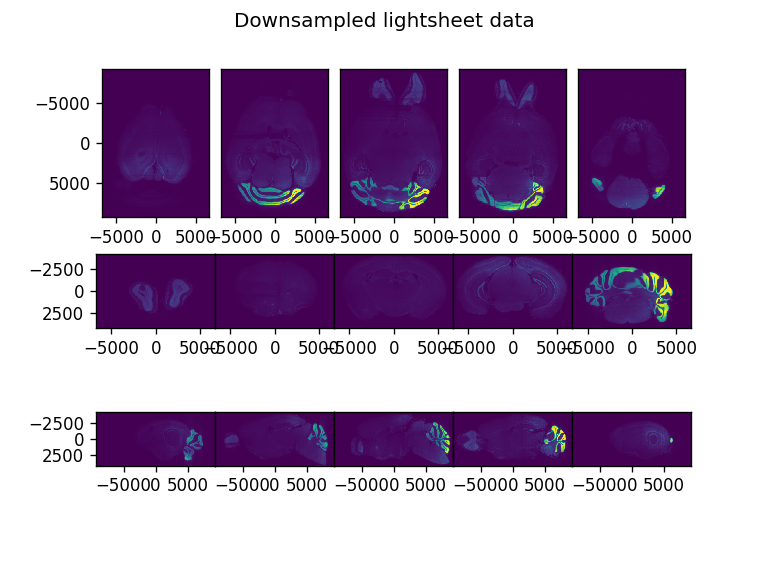

4294967296 4294967296


In [8]:
fig,ax = emlddmm.draw(J,xJ,vmin=0)
fig.suptitle('Downsampled lightsheet data')
figopts = {'dpi':300,'quality':90}
fig.savefig(output_prefix + 'downsampled.jpg',**figopts)

In [9]:
# load atlas images
atlas_names = [
    '/home/dtward/data/AllenInstitute/allen_vtk/ara_nissl_50.vtk',
    '/home/dtward/data/AllenInstitute/allen_vtk/average_template_50.vtk',
]
seg_name = '/home/dtward/data/AllenInstitute/allen_vtk/annotation_50.vtk'

In [10]:
I = []
for atlas_name in atlas_names:
    xI,I_,title,names = emlddmm.read_data(atlas_name)
    I_ = I_.astype(np.float32)
    I_ /= np.mean(np.abs(I_))
    I.append(I_)
    
I = np.concatenate(I)    
dI = [x[1] - x[0] for x in xI]
XI = np.meshgrid(*xI,indexing='ij')

Found extension .vtk
Found extension .vtk


<IPython.core.display.Javascript object>


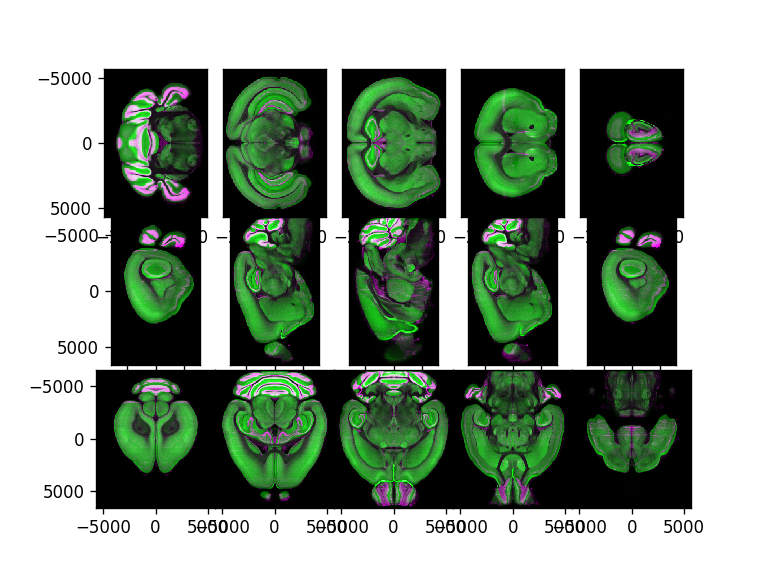

In [11]:
fig,ax = emlddmm.draw(I,xI,vmin=0)
fig.canvas.draw()

Found extension .vtk


<IPython.core.display.Javascript object>


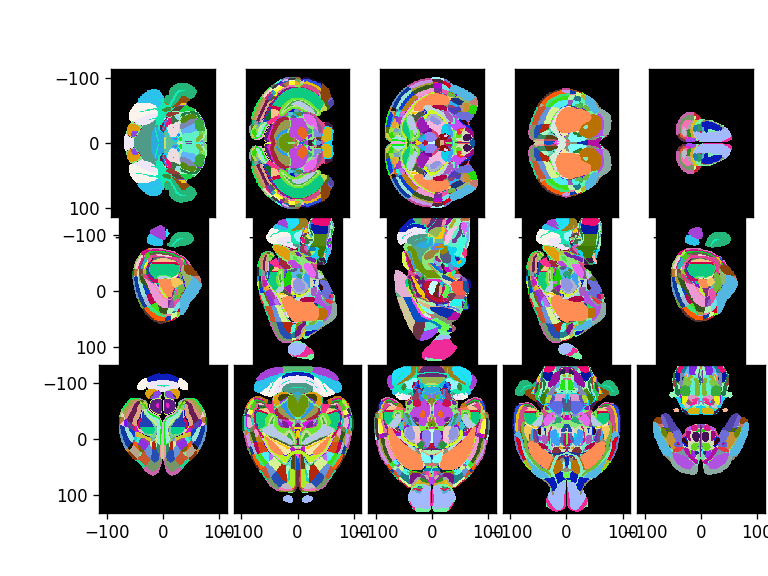

In [12]:
# next is to transforom the high resolution data
xS,S,title,names = emlddmm.read_data(seg_name)
# we want to visuze the above with S
labels = np.unique(S)
RGB = np.zeros((3,S.shape[1],S.shape[2],S.shape[3]))
colors = np.random.rand(len(labels),3)
colors[0] = 0.0
for i,l in enumerate(labels):
    RGB[:,S[0]==l] = colors[i][...,None]
fig,ax = emlddmm.draw(RGB)
plt.subplots_adjust(wspace=0,hspace=0,right=1)

<IPython.core.display.Javascript object>


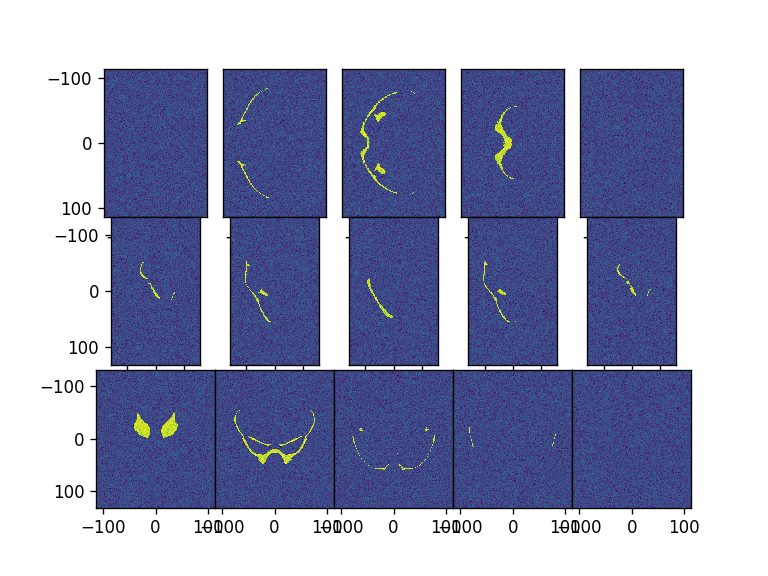

<IPython.core.display.Javascript object>


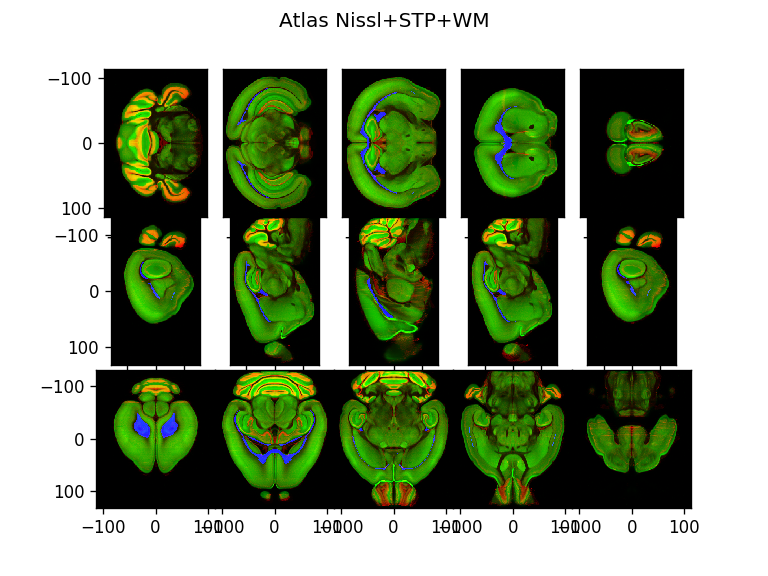

4294967296 4294967296


In [13]:
# I would like to add a channel to I that corresponds to corpus callosum
# see here: http://api.brain-map.org/api/v2/structure_graph_download/1.json
Icc = np.zeros_like(S)
Icc |= S==776 # corpus callosum
Icc |= S==956 # corpus callosum, anterior forceps
Icc |= S==964 # corpus callosum, extreme capsule
Icc |= S==1108 # genu of corpus callosum
Icc |= S==971 # corpus callosum, posterior forceps
Icc |= S==979 # corpus callosum, rostrum
Icc |= S==484682516 # corpus callosum, body
Icc |= S==986 # corpus callosum, splenium
# maybe add cingulum bundle, 940
Icc |= S==940
# maybe add fimbria, 603
Icc |= S==603
Icc = Icc.astype(I.dtype)
emlddmm.draw((Icc+np.random.randn(*Icc.shape)*0.1))
Icc /= np.mean(np.abs(Icc))
I = np.concatenate((I,Icc))
fig,ax = emlddmm.draw(I)
fig.suptitle('Atlas Nissl+STP+WM')
fig.savefig(output_prefix + 'atlasRGB.jpg',**figopts)



# Initial preprocessing



## Target preprocessing

265721


<IPython.core.display.Javascript object>


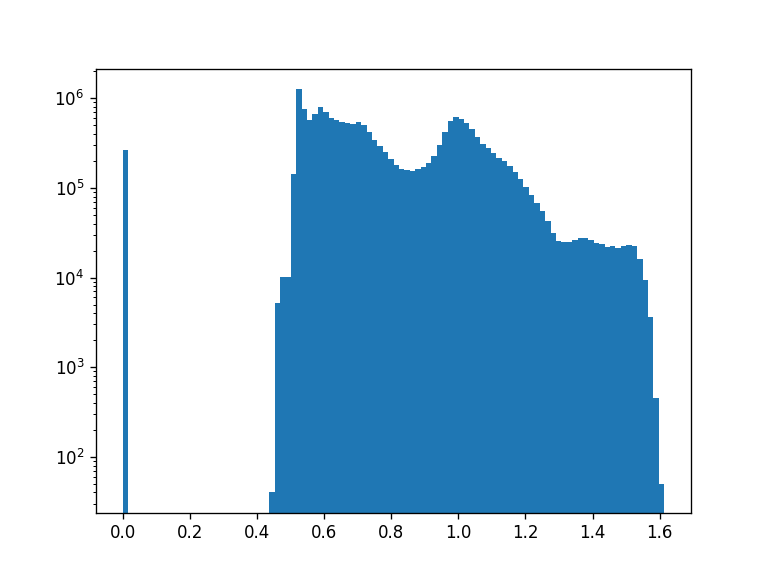

<IPython.core.display.Javascript object>


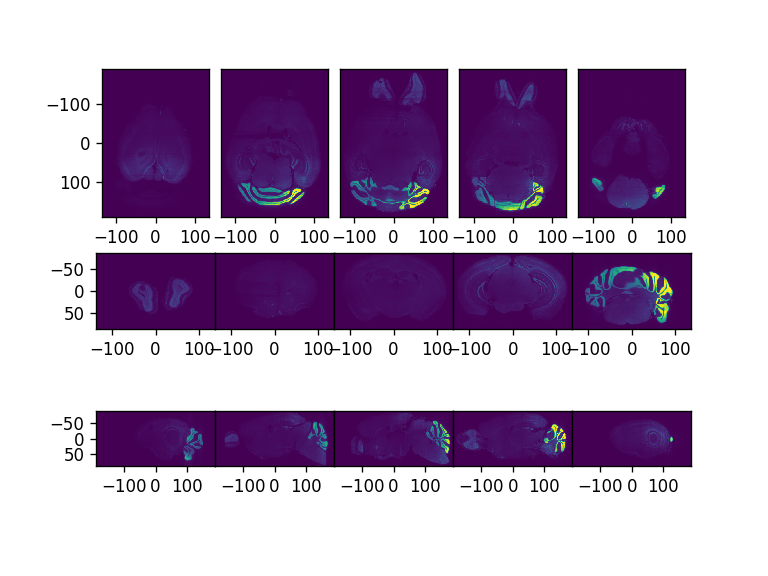

(<Figure size 640x480 with 15 Axes>,
 [[<matplotlib.axes._subplots.AxesSubplot at 0x7f0dd7798210>,
   <matplotlib.axes._subplots.AxesSubplot at 0x7f0dd2d0e610>]])

In [14]:
J = np.copy(J0)
print(np.sum(J==0))
# adjust zero pixels
q = 0.00
Jq = np.quantile(J,q)
J[J<=Jq] = Jq
J -= np.min(J)
f,ax = plt.subplots()
ax.hist((J**0.125).ravel(),100,log=True)
emlddmm.draw(J)

<IPython.core.display.Javascript object>


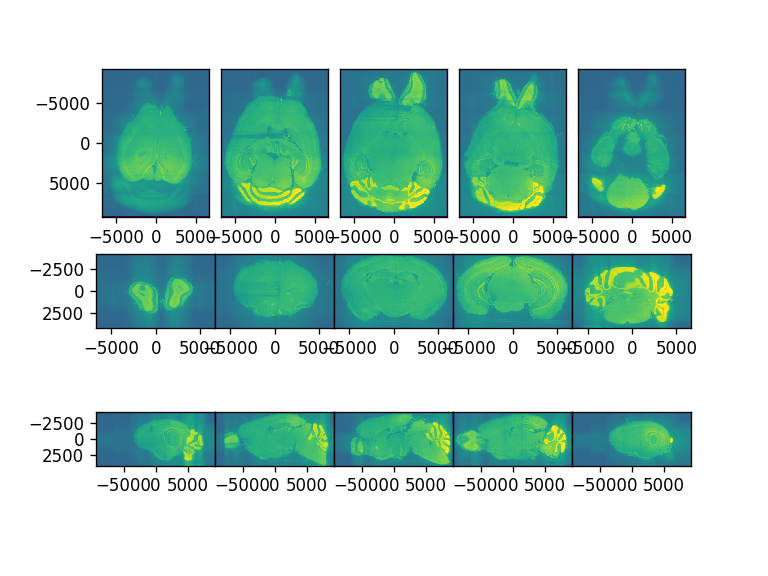

<IPython.core.display.Javascript object>


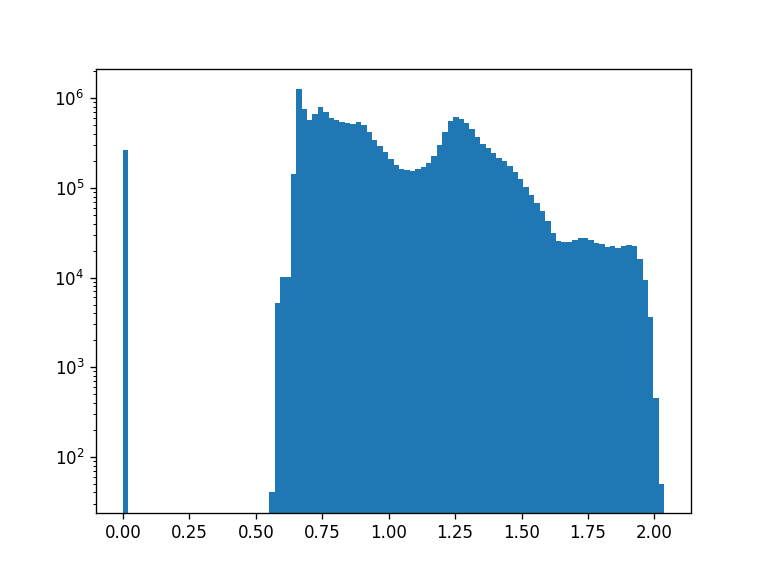

In [15]:
# adjust dynamic range
J = J**0.125
# adjust mean value
J /= np.mean(np.abs(J))
fig,ax = emlddmm.draw(J,xJ,vmin=0)
fig.canvas.draw()
fig,ax = plt.subplots()
ax.hist(J.ravel(),100,log=True)
fig.canvas.draw()

<IPython.core.display.Javascript object>


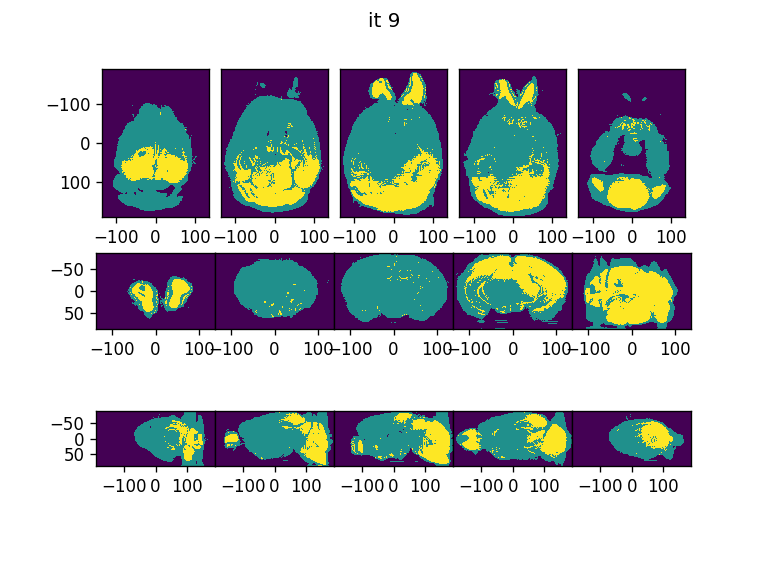

In [16]:
# let's detect background, we'll cluster into 3 class with kmeans
fig = plt.figure()
niter = 10
mu = np.array([0.,np.quantile(J,0.9),np.quantile(J,0.999)])
clold = np.zeros(J.shape[1:])
for it in range(niter):
    d2 = (J - mu[...,None,None,None])**2
    # assign
    cl = np.argmin(d2,axis=0)
    # update
    for i in range(len(mu)):
        mu[i] = np.mean(J[cl[None]==i])
    emlddmm.draw(cl[None],fig=fig)
    fig.suptitle(f'it {it}')
    fig.canvas.draw()
    if np.all(cl==clold):
        break
    clold = cl

<IPython.core.display.Javascript object>


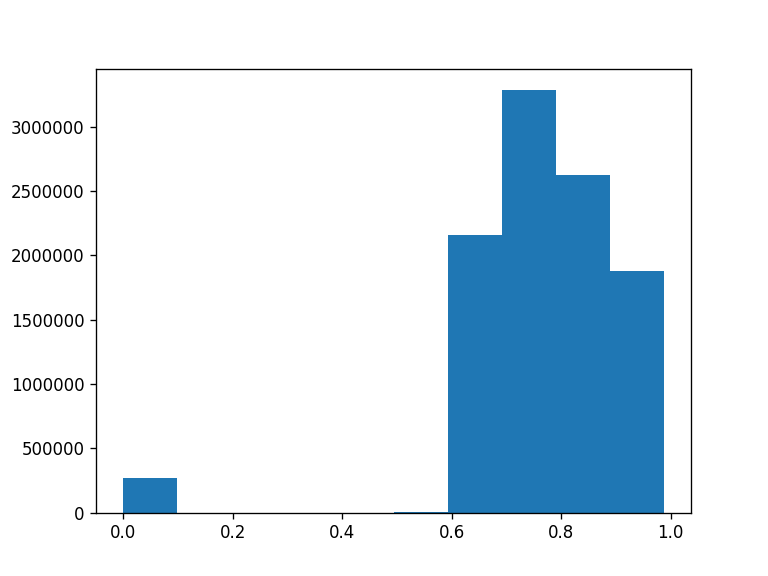

(array([ 265721.,       0.,       0.,       0.,       0.,    6696.,
        2157330., 3283008., 2625380., 1881591.]),
 array([0.        , 0.09879945, 0.1975989 , 0.29639834, 0.3951978 ,
        0.49399725, 0.5927967 , 0.69159615, 0.7903956 , 0.889195  ,
        0.9879945 ], dtype=float32),
 <a list of 10 Patch objects>)

In [17]:
# look at background hist
f,ax = plt.subplots()
ax.hist(J[cl[None]==0])

In [18]:
# we want a softmax with an elbow at the background max
# anything less than this will quickly go to zero
cut = np.max(J[cl[None]==0])
cutstd = np.std(J[cl[None]==0])
cut,cutstd

(0.9879945, 0.1568281)

<IPython.core.display.Javascript object>


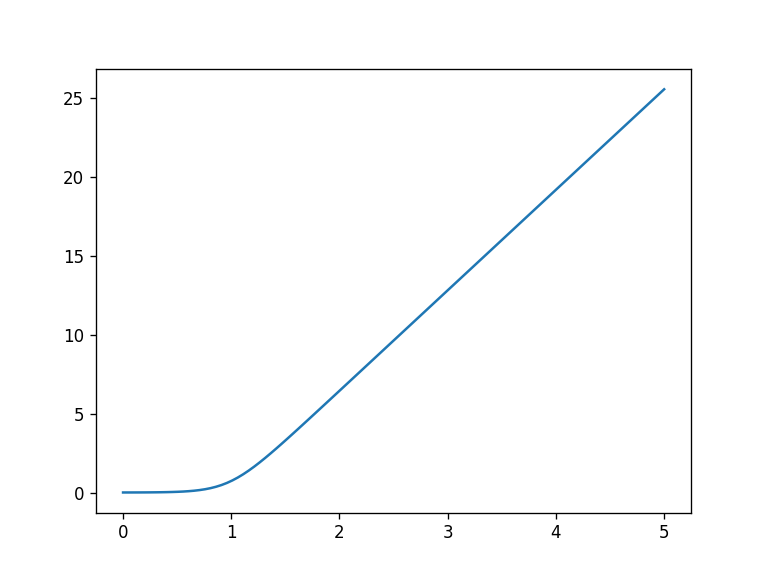

In [19]:
t = np.linspace(0.0,5.0,100)
f,ax = plt.subplots()
ax.plot(t,np.log(1.0 + np.exp((t-cut)/cutstd)))
# how to encode the elbow

<IPython.core.display.Javascript object>


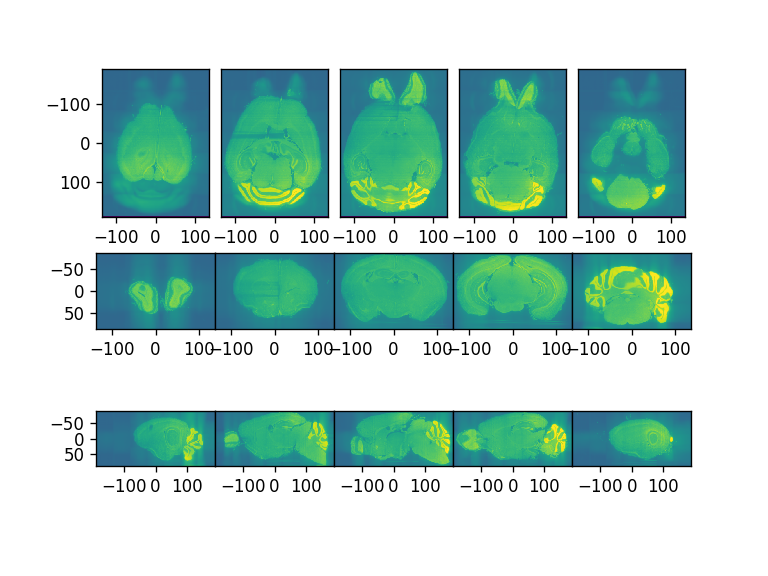

<IPython.core.display.Javascript object>


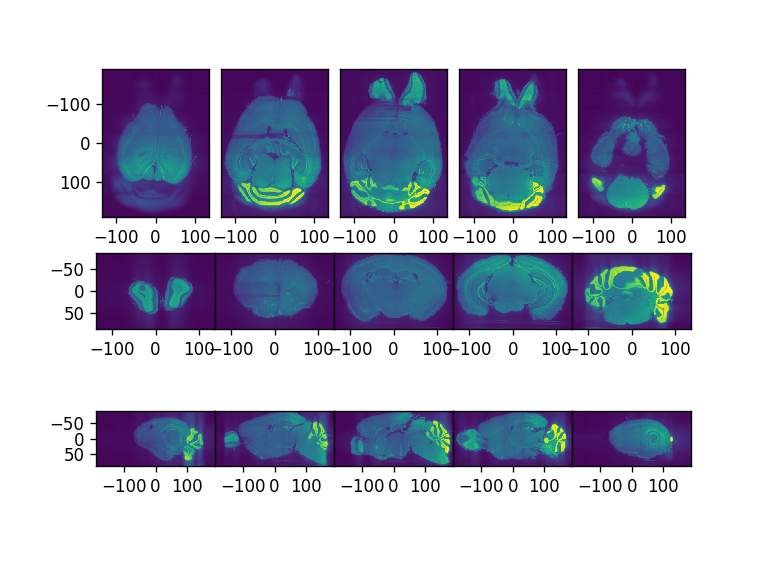

In [20]:
# now we want to suppress the background
# I'll use a softplus
#beta = 1.0/np.mean(J[cl[None]==0])
#J_ = np.log(1.0 + np.exp((J - 1.0/beta)*beta))/beta
#p = 3
#J_ = (1.0 + (J*beta)**p)**(1/p)/beta - 1.0
J_ = np.log(1.0 + np.exp((J-cut)/np.std(J[cl[None]==0])))

t = np.linspace(0.0,5.0,100)
#f,ax = plt.subplots()
#ax.plot(t,np.log(1.0 + np.exp((t - 1.0/beta)*beta))/beta)
emlddmm.draw(J,vmin=0)
emlddmm.draw(J_,vmin=0)
J = J_/np.mean(np.abs(J_))


<IPython.core.display.Javascript object>


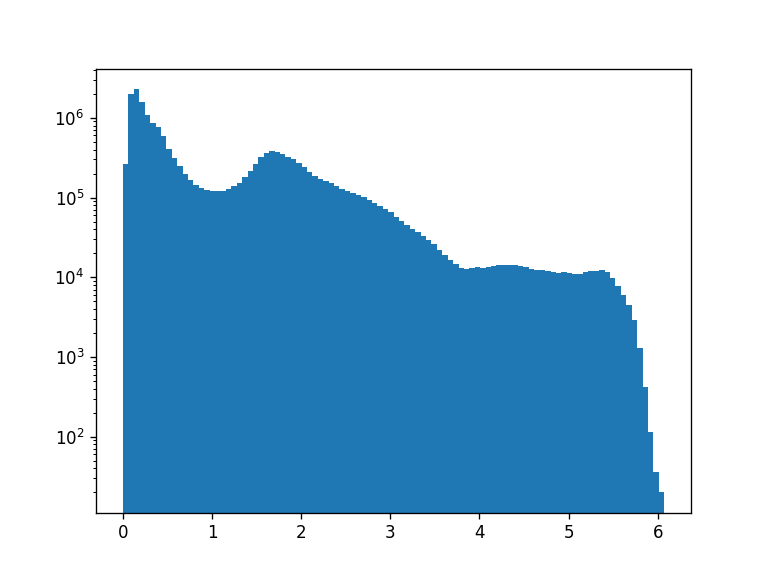

<IPython.core.display.Javascript object>


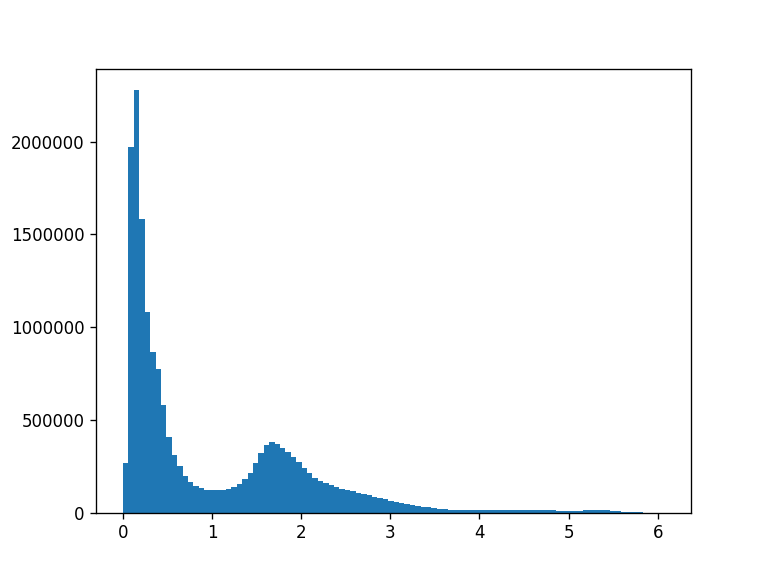

In [21]:
fig,ax = plt.subplots()
ax.hist(J.ravel(),100,log=True)
fig.canvas.draw()

fig,ax = plt.subplots()
ax.hist(J.ravel(),100,log=False)
fig.canvas.draw()

In [22]:
# i would like to minimize entropy but keep the same first and second moment
# that is the ideal
# that would require some kind of constrained optimization

# Inhomogeneity

We look for a smooth $v$ to minimize the entropy
\begin{align}
H &= -\sum_i p_i \log(p_i)
\end{align}

Where 
\begin{align}
p_i &=\frac{ \sum_j k( I_j\exp(v) - b_i) }{ \sum_{i'} \sum_j k(I_j\exp(v) - b_{i'})}
\end{align}

And $k$ is a Gaussian
\begin{align}
k(x) &= \exp(-x^2)
\end{align}


Work out the derivative of $H$ with respect to $p$
\begin{align}
&\frac{d}{d\epsilon} -\sum_i (p_i + \epsilon \delta p_i) \log(p_i + \epsilon \delta p_i)\big|_{\epsilon = 0}\\
&= -\sum_i \delta p_i \log(p_i) + p_i \frac{1}{p_i} \delta p_i\\
&= -\sum_i (\log(p_i) + 1) \delta p_i
\end{align}

So the derivative is
\begin{align}
dH &= - \log(p_i) - 1
\end{align}
for $N$ classes

Now let $x = I\exp(v)$, and we'll work out the derivative of $p$
\begin{align}
&\frac{d}{d\epsilon} \frac{\sum_j k(x_j + \epsilon \delta x_j - b_i)}{\sum_{i'} \sum_{j}k(x_j + \epsilon \delta x_j - b_{i'})}\bigg|_{\epsilon = 0}\\
&= \frac{\sum_j \left(k'(x_j - b_i)\delta x_j\right)\left(\sum_{i'} \sum_{j}k(x_j  - b_{i'})\right) - \left(\sum_j k(x_j - b_i)\right)\left(\sum_{i'}\sum_j k'(x_j - b_{i'})\delta x_j\right)}{\sum_{i'}\sum_j k(x_{j} - b_{i'})}
\end{align}
So we have
\begin{align}
dp_i &= \frac{k'(x_j - b_i)\left(\sum_{i'} \sum_{j}k(x_j  - b_{i'})\right) - \sum_j k(x_j - b_i)\sum_i k'(x_j - b_i)}{\sum_{i'}\sum_j k(x_{j} - b_{i'})}
\end{align}
And if $\sum_i k(x - b_i) = K$ (a constant, i.e. if this sum approaches an integral over a gaussian), and then $\sum_i k'(x - b_i) = 0$ we have a simplification
\begin{align}
dp_i &= \frac{k'(x_j - b_i)MK -0}{MK} = k'(x_j - b_i)
\end{align}
if there are $M$ pixels and $N$ bins.

And last we have $dx = I \exp(v) $

Putting it all together we get a gradient
\begin{align}
\sum_i \left(- \log(p_i) - 1\right) k'( I_j \exp(v_j) - b_i)I_j \exp(v_j)
\end{align}
Note that this is nice and simple, whatever $K$ is.

The important thing here is that we can do a running sum over $i$.

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


<IPython.core.display.Javascript object>


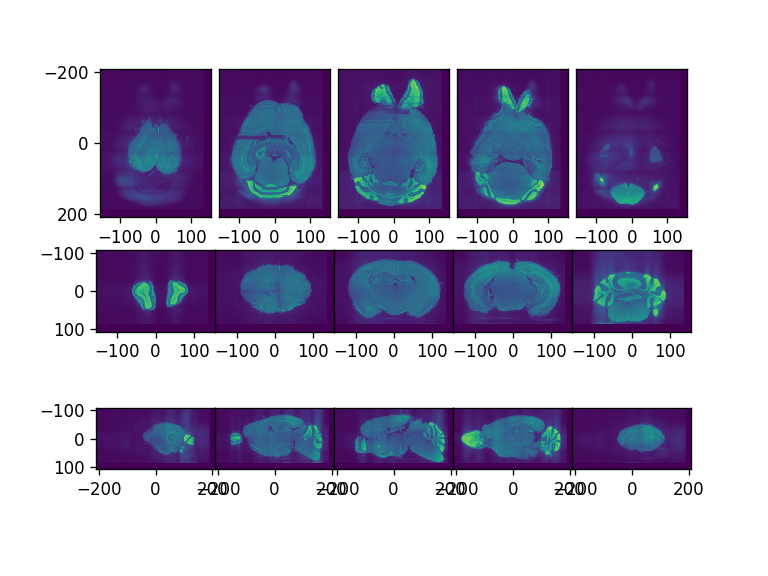

<IPython.core.display.Javascript object>


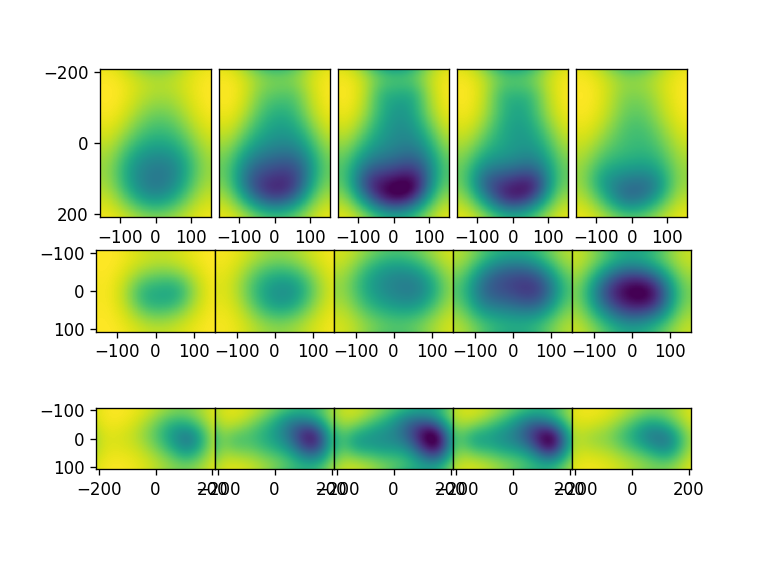

<IPython.core.display.Javascript object>


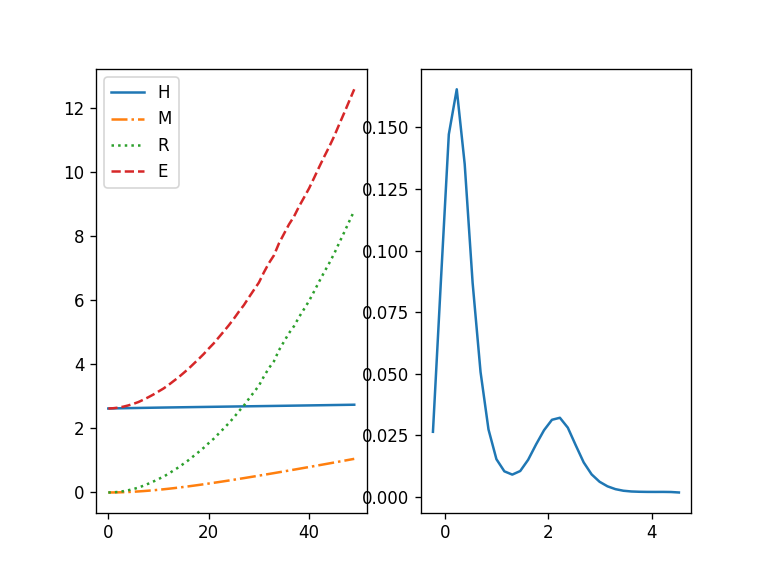

In [23]:
Jsave = np.copy(J)
import torch
# I need to double check that the signs are correct here
npad = 20
Jp = np.pad(J,((0,0),(npad,npad),(npad,npad),(npad,npad)), mode='edge')
device = 'cuda:0'
I0t = torch.as_tensor(Jp[0],device=device) # one channel

# get entropy with kernel density estimate

sigmaR = 1e3 # reg
per_pixel = True # if false, use mean and variance
sigmaM = 1e3 # match, 1e4 was good for per pixel

a = 20.0 # smoothing
p = 2.0
max_ = np.quantile(J,0.99)
#max_ = np.max(J)
min_ = 0.0 - max_*0.05
step = (max_-min_)/32
width = step # gaussian
bins = torch.arange(min_,max_,step,device=device)
ep = 5e-5



niter = 50
f = [torch.arange(n,device=device)/n for n in I0t.shape]
F = torch.stack(torch.meshgrid(f))
L = (1.0 + 2.0*a**2*torch.sum((1.0 - torch.cos(2.0*np.pi*F)),0))**p
K = 1.0/L**2

fig = plt.figure()
fig2 = plt.figure()
fig3,ax3 = plt.subplots(1,2)

v = torch.zeros_like(I0t)
Esave = []
for it in range(niter):
    # get density estimate
    I0tv = I0t*torch.exp(v) 
    #print(torch.std(I0tv[npad:-npad,npad:-npad,npad:-npad]).item())
    
    # we'll loop over i
    H = 0.0
    dH = torch.zeros_like(v)
    pmf = torch.zeros(len(bins))
    for i in range(len(bins)):
        p_i = torch.sum(torch.exp(-(I0tv - bins[i])**2/(2.0*width**2)))/np.sqrt(2.0*np.pi*width**2)
        pmf[i] = p_i
    pmf[torch.isnan(pmf)] = 0.0
    pmf /= torch.sum(pmf)
    for i in range(len(bins)):
        p_i = pmf[i]
        logpi = torch.log(p_i)
        H += -(p_i * logpi)
        dH += (-logpi - 1.0)*p_i * (I0tv - bins[i])
    dH *= I0tv/np.sqrt(2.0*np.pi*width**2)/width**2
    
    
    # we need to stay close to original data
    if per_pixel:
        M = torch.sum((I0tv - I0t)**2)/2.0/sigmaM**2
    else:
        M = (torch.mean(I0tv) - torch.mean(I0t))**2/2.0/sigmaM**2 +  (torch.std(I0tv) - torch.std(I0t))**2/2.0/sigmaM**2
    # we need reg for this we need a highpass
    R = torch.sum(torch.abs(torch.fft.fftn(v))**2*L**2)/torch.numel(v)/2.0/sigmaR**2
    E = H + M + R    
    Esave.append([(H).item(),M.item(),R.item(),E.item()])
    
    grad = dH + (I0tv - I0t)/sigmaM**2
    grad = torch.fft.ifftn(torch.fft.fftn(grad)*K).real + v/sigmaR**2
    v -= ep*grad
    
    # can we do something to make sure it has the same mean? or better yet the same std
    #Ivm = torch.mean((I0t*torch.exp(v))[:,npad:-npad,npad:-npad,npad:-npad])
    #v += torch.log(torch.mean(I0t[:,npad:-npad,npad:-npad,npad:-npad])/Ivm)
    
    # We want std(I0 exp(v+k)) = std(I0)
    # solve for k
    # std(I0 exp(v+k)) = std(I0 exp(v) exp(k)) = exp(k) std(I0exp(v))
    # so exp(k) = std(I0) / std(I0exp(v))
    # so k = log(std(I0) / std(I0exp(v)))
    Ivs = torch.std((I0t*torch.exp(v))[npad:-npad,npad:-npad,npad:-npad])
    v += torch.log(torch.std(I0t[npad:-npad,npad:-npad,npad:-npad])/Ivs)
    
    if not it%10 or it == niter-1:
        with torch.no_grad():
            emlddmm.draw(I0tv.cpu()[None],fig=fig,
                         vmin=torch.min(I0tv[npad:-npad,npad:-npad,npad:-npad]).cpu().item(),
                         vmax=torch.max(I0tv[npad:-npad,npad:-npad,npad:-npad]).cpu().item())
            emlddmm.draw(v[None].cpu(),fig=fig2,
                         vmin=None,#np.log(1/1.5),
                         vmax=None,#np.log(1.5)
                        )
            ax3[0].cla()
            #ax3[0].plot(Esave)
            ax3[0].plot(np.array(Esave)[:,0],ls='-')
            ax3[0].plot(np.array(Esave)[:,1],ls='-.')
            ax3[0].plot(np.array(Esave)[:,2],ls=':')
            ax3[0].plot(np.array(Esave)[:,3],ls='--')
            ax3[0].legend(['H','M','R','E'])
            ax3[1].cla()
            ax3[1].plot(bins.cpu().numpy(),pmf.detach().clone().cpu().numpy())
            fig.canvas.draw()
            fig2.canvas.draw()
            fig3.canvas.draw()

<IPython.core.display.Javascript object>


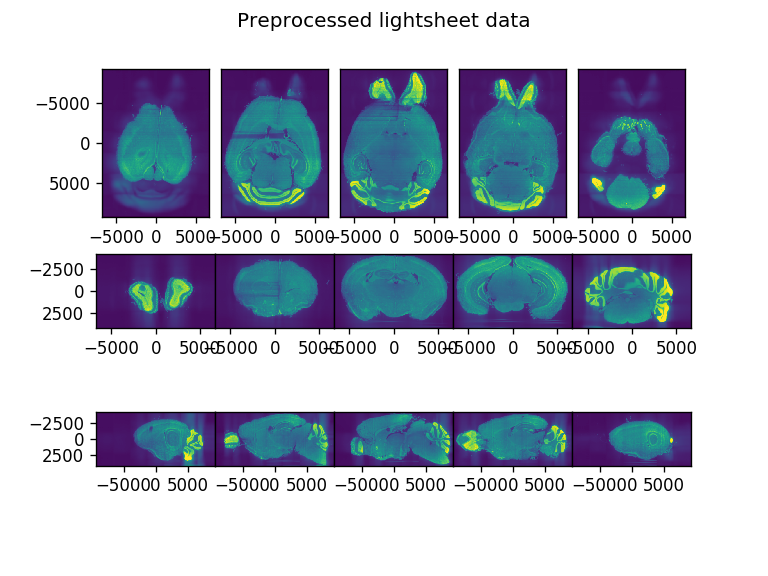

4294967296 4294967296


In [24]:
J = I0tv.detach().clone().cpu().numpy()[None,npad:-npad,npad:-npad,npad:-npad]
#J = I0t.detach().clone().cpu().numpy()[None,npad:-npad,npad:-npad,npad:-npad] # forget it
J /= np.mean(np.abs(J))
fig,ax = emlddmm.draw(J,xJ)
fig.suptitle('Preprocessed lightsheet data')
fig.savefig(output_prefix + 'processed.jpg',**figopts)

## Atlas preprocessing


In [25]:
# pad
# since I will downsample by 4, I want to pad with 4x4x4
npad = 4
I = np.pad(I,  ((0,0),(npad,npad),(npad,npad),(npad,npad)) )
for i in range(npad):
    xI = [ np.concatenate(   (x[0][None]-d,x,x[-1][None]+d)   ) for d,x in zip(dI,xI)]


In [26]:
# nissl image dynamic range
I[0] = I[0]**0.25
I[0] /= np.mean(np.abs(I[0]))

/home/dtward/data/csh_data/emlddmm/emlddmm.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


<IPython.core.display.Javascript object>


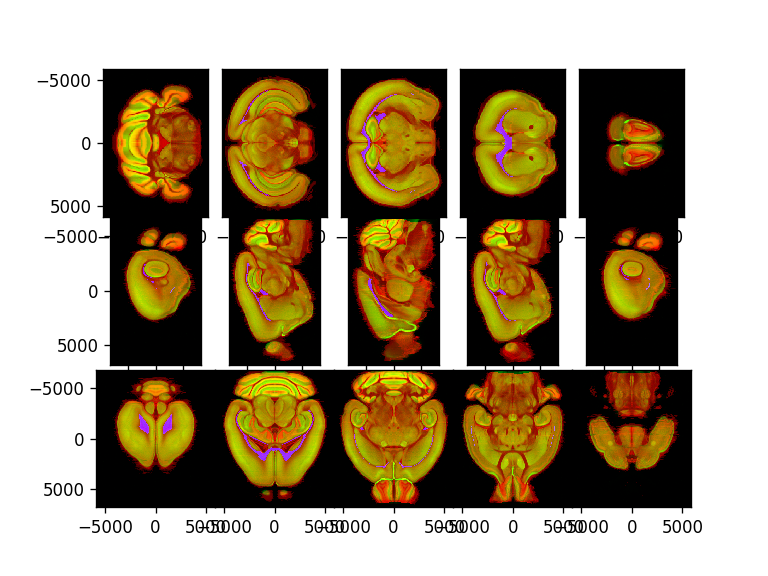

In [27]:
fig,ax = emlddmm.draw(I,xI,vmin=0)
fig.canvas.draw()

# Registration

/home/dtward/data/csh_data/emlddmm/emlddmm.py:2073: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)
  X = torch.as_tensor(X,dtype=self.data.dtype,device=self.data.device)


<IPython.core.display.Javascript object>


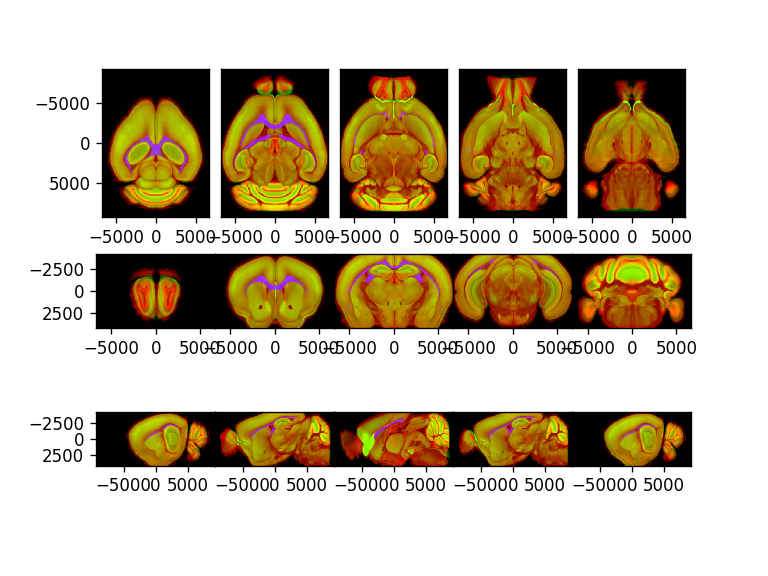

In [28]:
# initial affine
# make sure to keep sign of Jacobian
A0 = np.diag((1.3,1.3,1.3,1.0))
# flip x0,x1
#A0 = np.array([[0.0,-1.0,0.0,0.0],[1.0,0.0,0.0,0.0],[0.0,0.0,1.0,0.0],[0.0,0.0,0.0,1.0]])@A0
# flip x0,x2
A0 = np.array([[0.0,0.0,-1.0,0.0],[0.0,1.0,0.0,0.0],[1.0,0.0,0.0,0.0],[0.0,0.0,0.0,1.0]])@A0
# flip x1,x2
A0 = np.array([[-1.0,0.0,0.0,0.0],[0.0,0.0,1.0,0.0],[0.0,1.0,0.0,0.0],[0.0,0.0,0.0,1.0]])@A0
# flip 
A0 = np.diag((1.0,-1.0,-1.0,1.0))@A0
# check it
XJ = np.meshgrid(*xJ,indexing='ij')
tform = emlddmm.Transform(A0,direction='b')
AI = emlddmm.apply_transform_float(xI,I,tform.apply(XJ))
fig,ax = emlddmm.draw(np.concatenate((AI,J)),xJ,vmin=0)
fig.canvas.draw()


dv tensor([100., 100., 100.], device='cuda:1')
a scale is 200.0


<IPython.core.display.Javascript object>


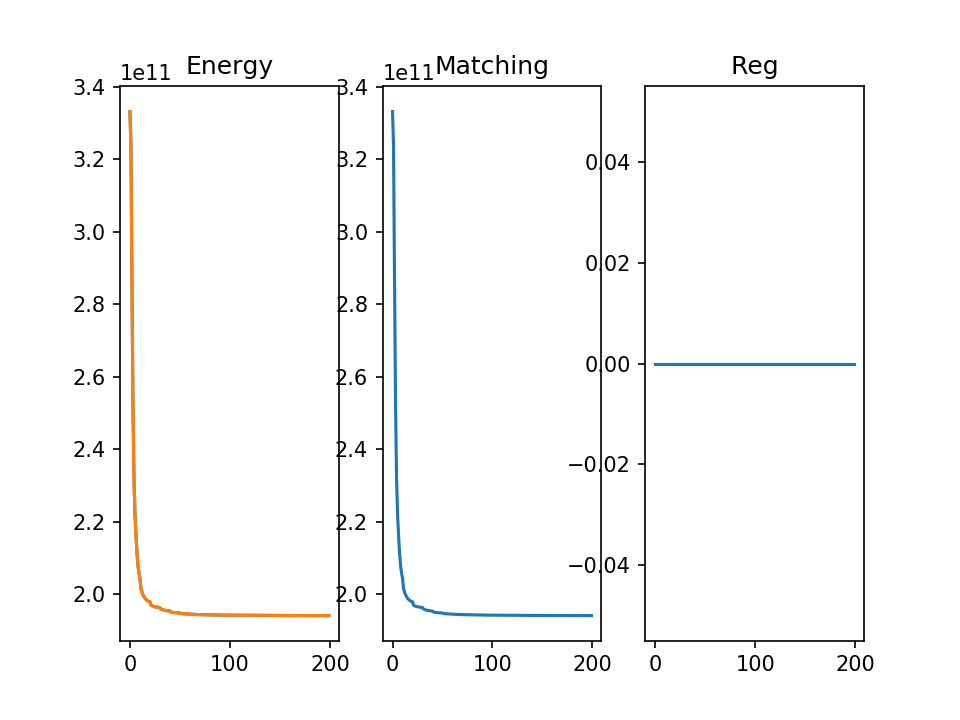

<IPython.core.display.Javascript object>


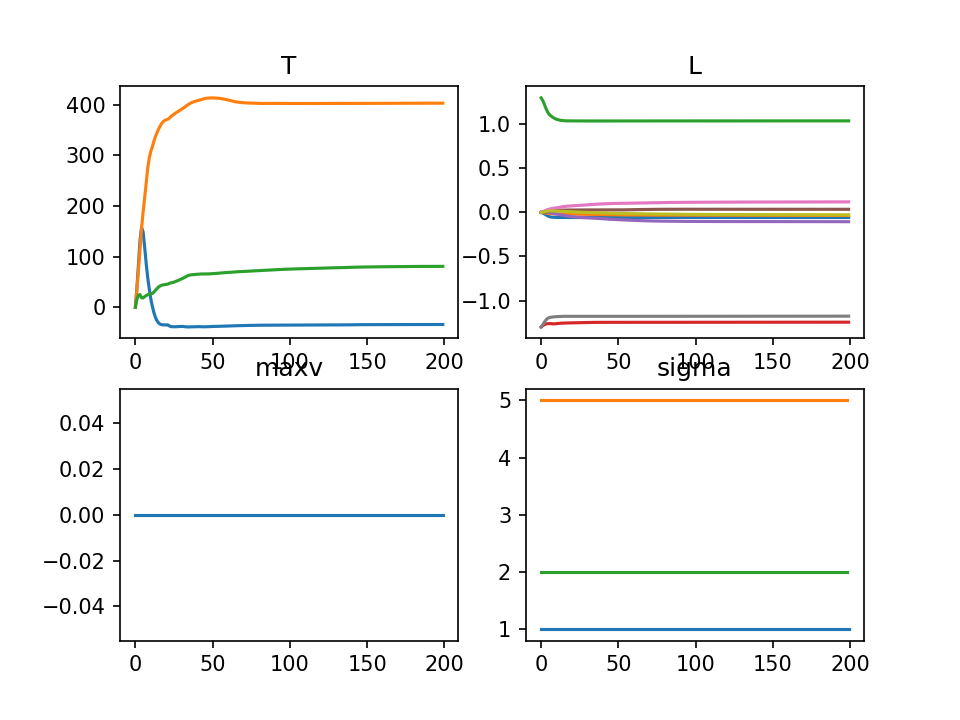

<IPython.core.display.Javascript object>


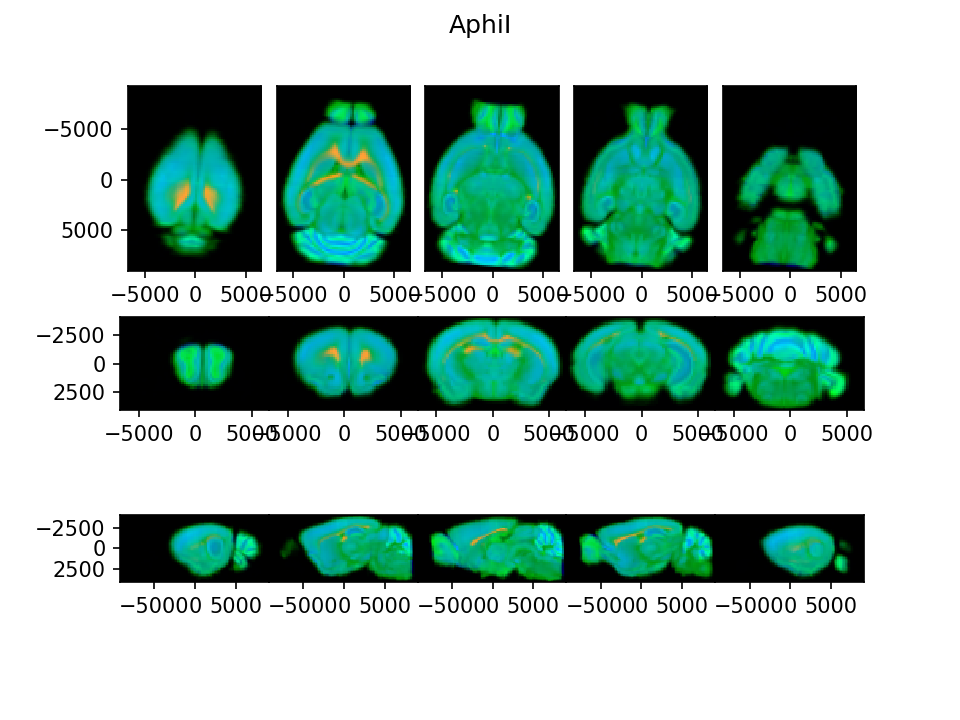

<IPython.core.display.Javascript object>


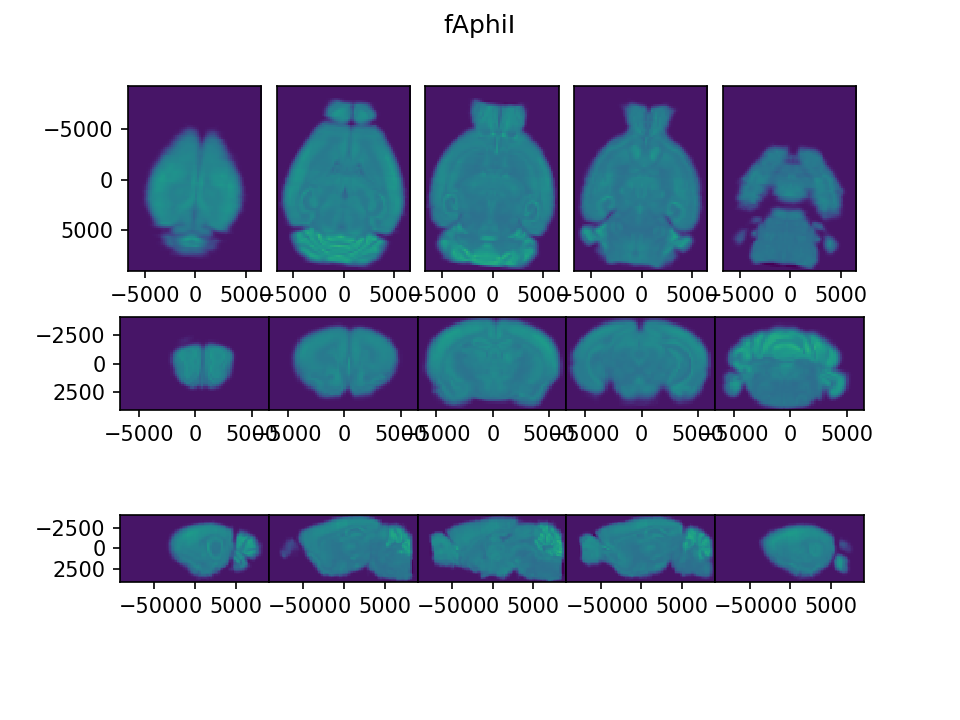

<IPython.core.display.Javascript object>


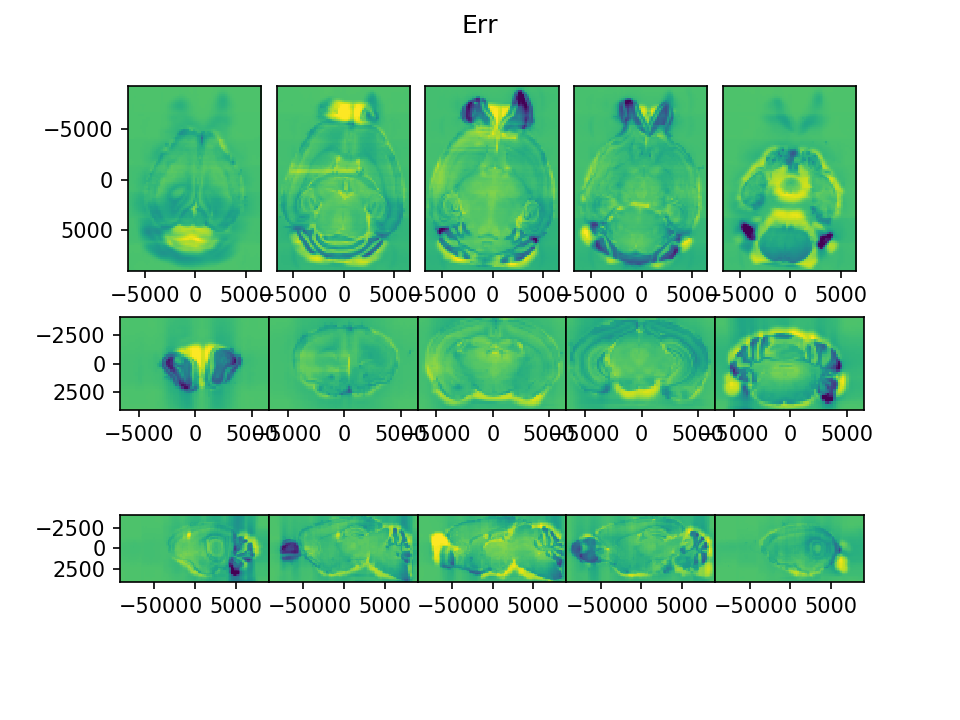

<IPython.core.display.Javascript object>


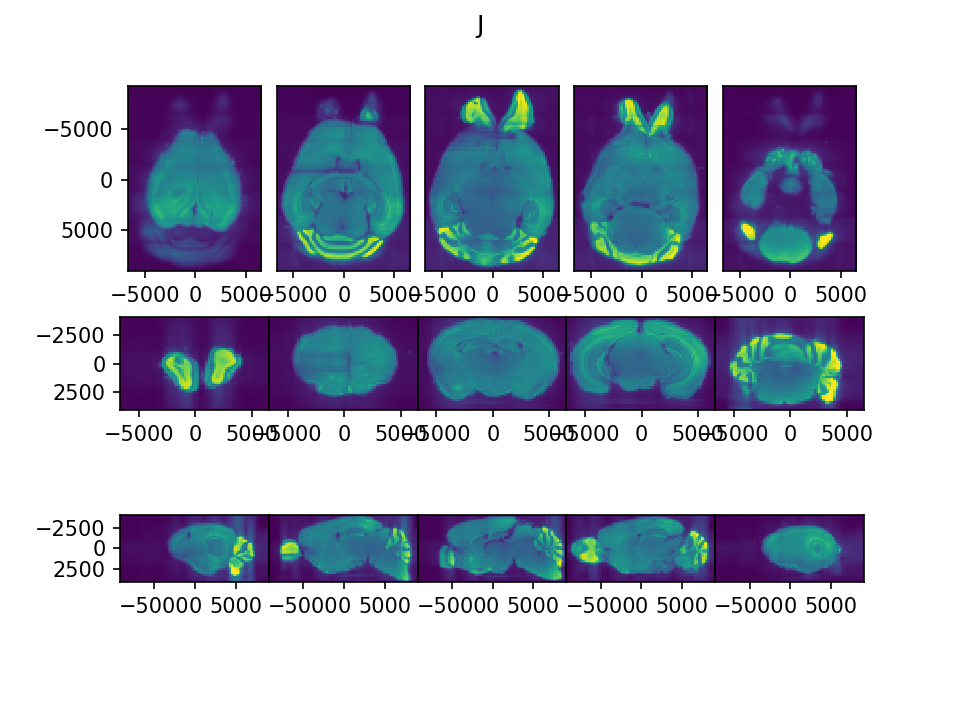

<IPython.core.display.Javascript object>


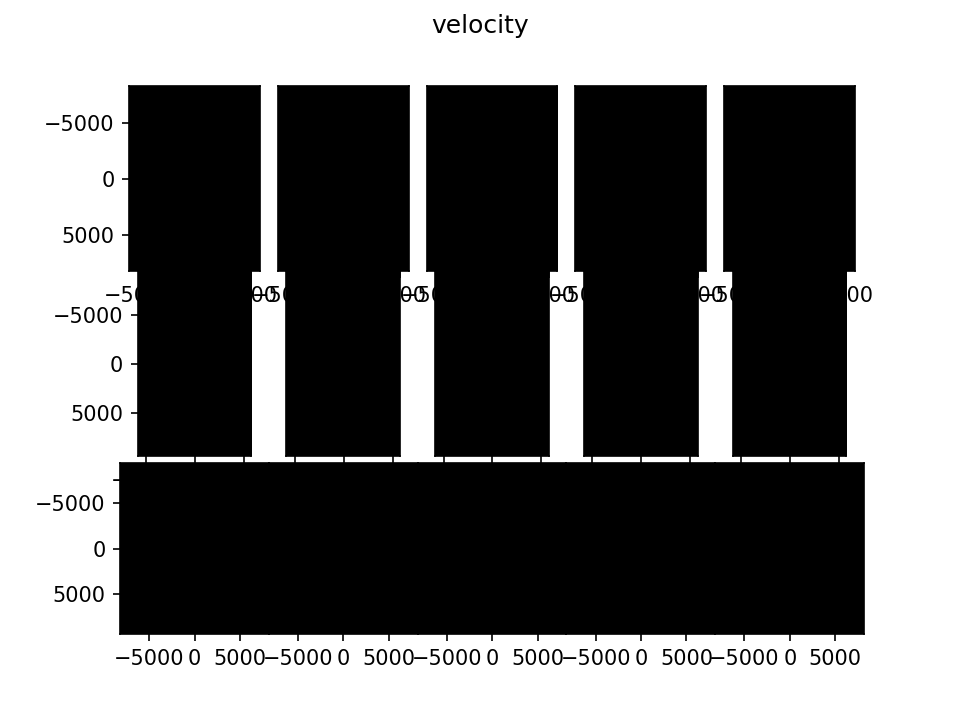

<IPython.core.display.Javascript object>


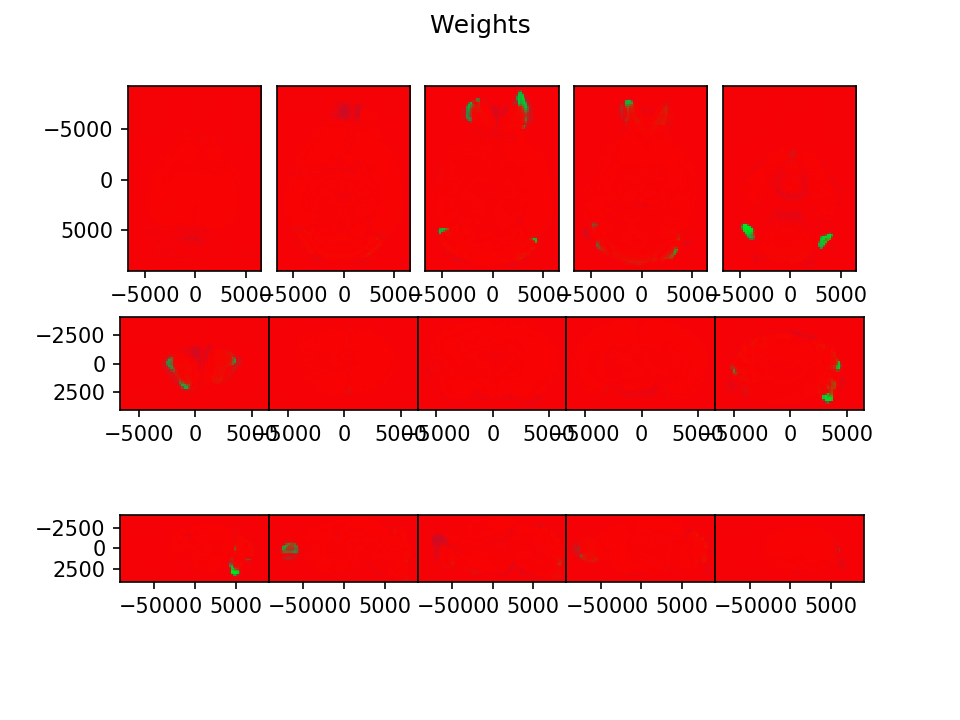

Finished iteration 0
Finished iteration 10
Finished iteration 20
Finished iteration 30
Finished iteration 40
Iteration 50, linear oscilating, reducing eA to 900000.0
Finished iteration 50
Finished iteration 60
Iteration 70, linear oscilating, reducing eA to 810000.0
Finished iteration 70
Finished iteration 80
Finished iteration 90
Finished iteration 100
Iteration 110, translation oscilating, reducing eA to 729000.0
Finished iteration 110
Iteration 120, linear oscilating, reducing eA to 656100.0
Finished iteration 120
Finished iteration 130
Finished iteration 140
Iteration 150, linear oscilating, reducing eA to 590490.0
Finished iteration 150
Finished iteration 160
Iteration 170, linear oscilating, reducing eA to 531441.0
Finished iteration 170
Iteration 180, translation oscilating, reducing eA to 478296.9
Finished iteration 180
Iteration 190, linear oscilating, reducing eA to 430467.21
Finished iteration 190


In [75]:
# now we want to register
# we'll start with an affine registration
import imp
imp.reload(emlddmm)
config0 = {
    'device':'cuda:1',
    'n_iter':200, 'downI':[4,4,4], 'downJ':[4,4,4],
     'priors':[0.9,0.05,0.05],'update_priors':False,
     'update_muA':0,'muA':[np.quantile(J,0.99)],
     'update_muB':0,'muB':[0.0],
     'update_sigmaM':0,'update_sigmaA':0,'update_sigmaB':0,
     'sigmaM':1.0,'sigmaB':2.0,'sigmaA':5.0,
     'order':1,'n_draw':50,'n_estep':3,'slice_matching':0,'v_start':1000,
     'eA':1e6,'A':A0,'full_outputs':True,
   }

W = 1.0 - (J[0]==0)
#I_ = np.stack((I[0],I[1],I[0]**2,I[0]*I[1],I[1]**2,))
I_ = np.stack((I[2],I[0],I[1],I[0]**2,I[0]*I[1],I[1]**2))
out = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J, W0=W, **config0)

In [30]:
out['coeffs']

tensor([[[[[ 3.1855e-01],
           [-5.2342e-03],
           [ 2.7040e+00],
           [-1.9236e+00],
           [-6.5743e-01],
           [ 5.3937e-01],
           [ 7.8644e-02]],

          [[ 3.3507e-01],
           [ 2.2252e-03],
           [ 1.4253e+00],
           [-2.3871e-01],
           [-2.9981e-01],
           [ 1.0568e-01],
           [-1.5387e-02]],

          [[ 2.0352e-01],
           [ 0.0000e+00],
           [ 0.0000e+00],
           [ 1.9062e+00],
           [ 0.0000e+00],
           [ 0.0000e+00],
           [ 6.3587e-02]]],


         [[[ 3.5346e-01],
           [ 4.0086e-03],
           [ 1.0318e+00],
           [-5.1702e-01],
           [-2.2576e-01],
           [ 2.6552e-01],
           [-8.2128e-03]],

          [[ 3.4664e-01],
           [ 1.6629e-03],
           [ 1.6679e+00],
           [-8.6190e-01],
           [-4.6942e-01],
           [ 3.8102e-01],
           [ 1.6561e-02]],

          [[ 3.2142e-01],
           [ 0.0000e+00],
           [-4.0897e-01],


dv tensor([500., 500., 500.])
a scale is 1000.0


<IPython.core.display.Javascript object>


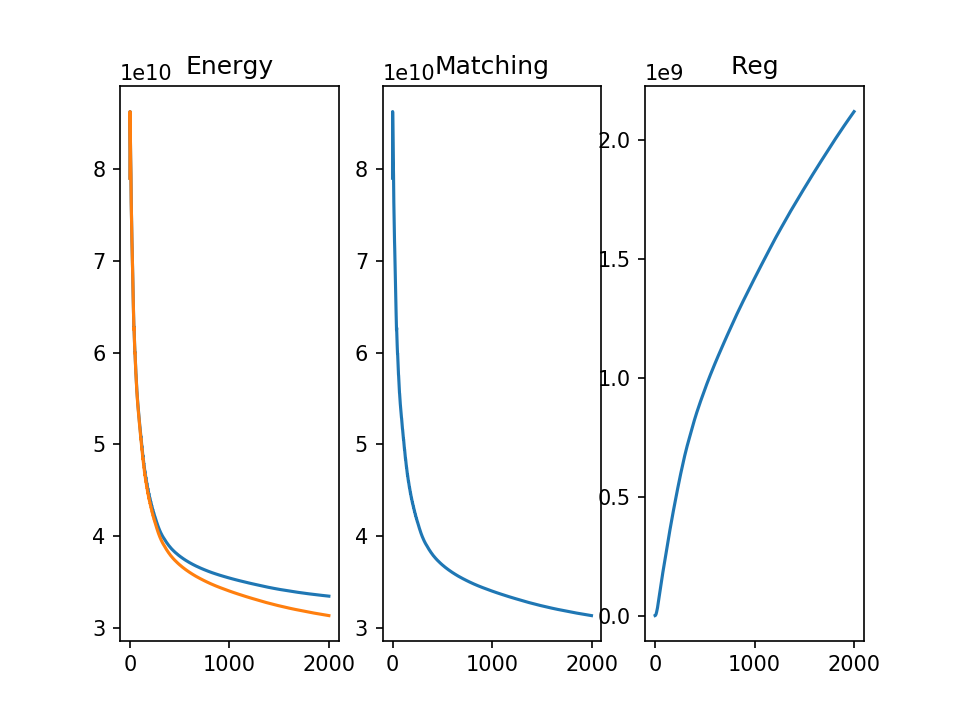

<IPython.core.display.Javascript object>


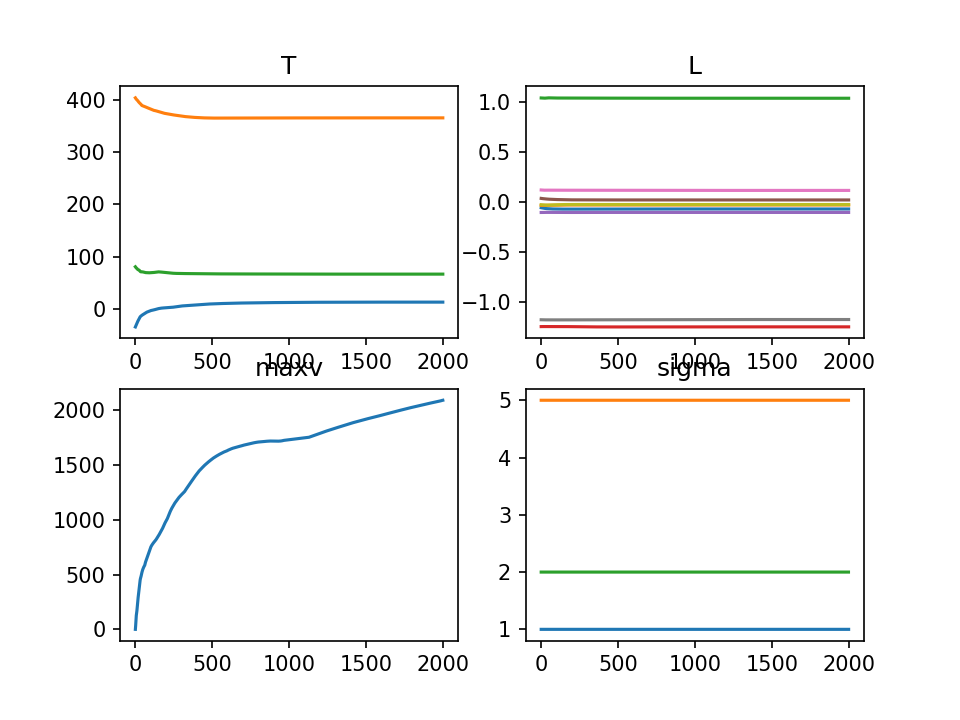

<IPython.core.display.Javascript object>


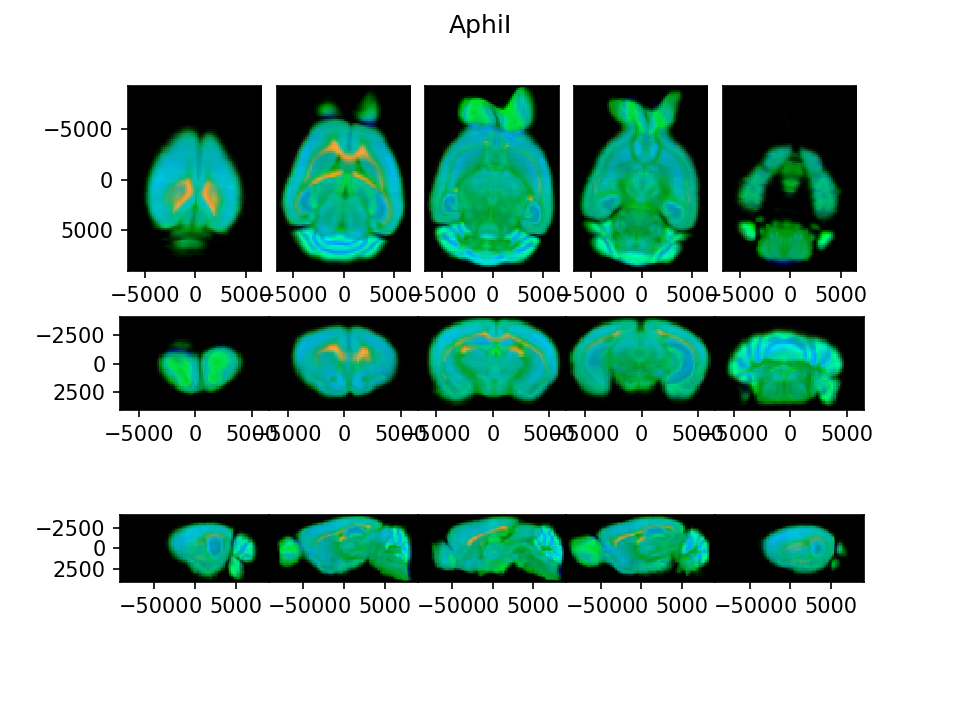

<IPython.core.display.Javascript object>


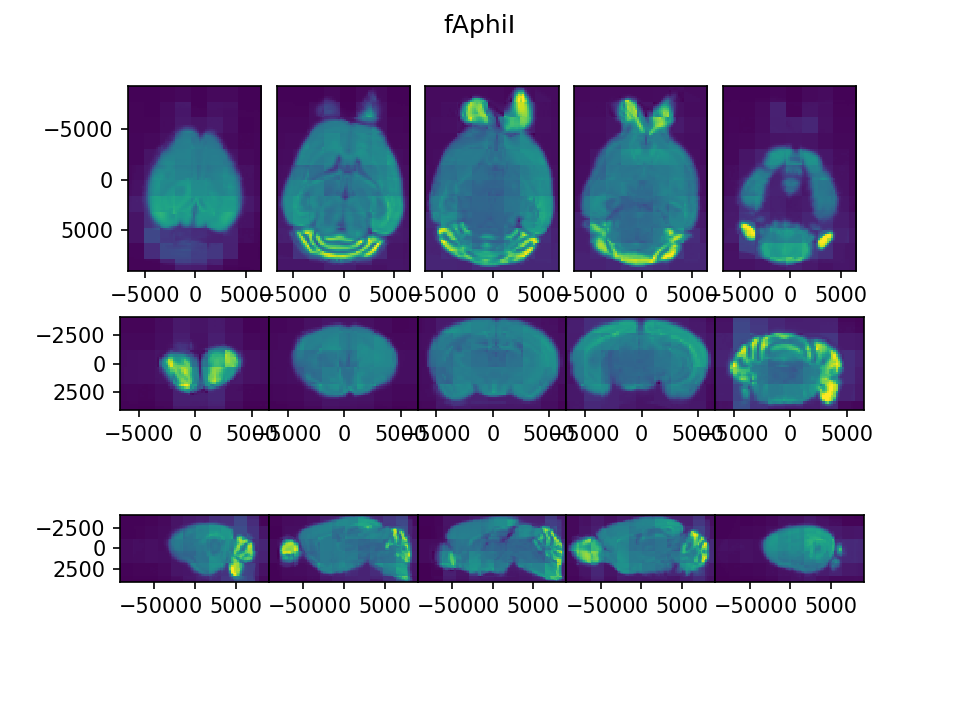

<IPython.core.display.Javascript object>


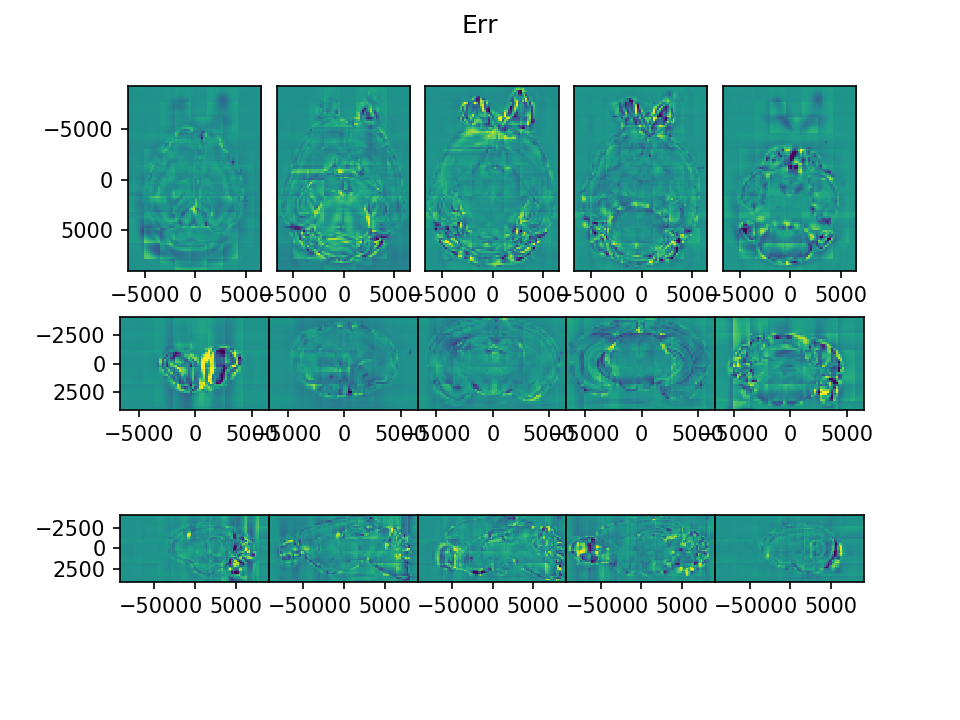

<IPython.core.display.Javascript object>


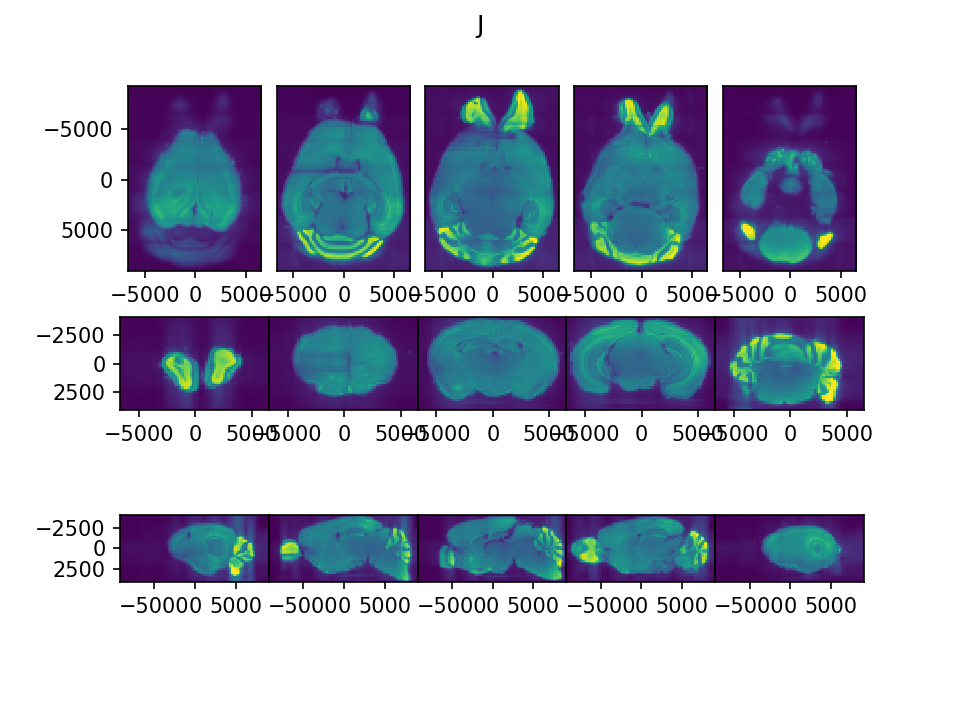

<IPython.core.display.Javascript object>


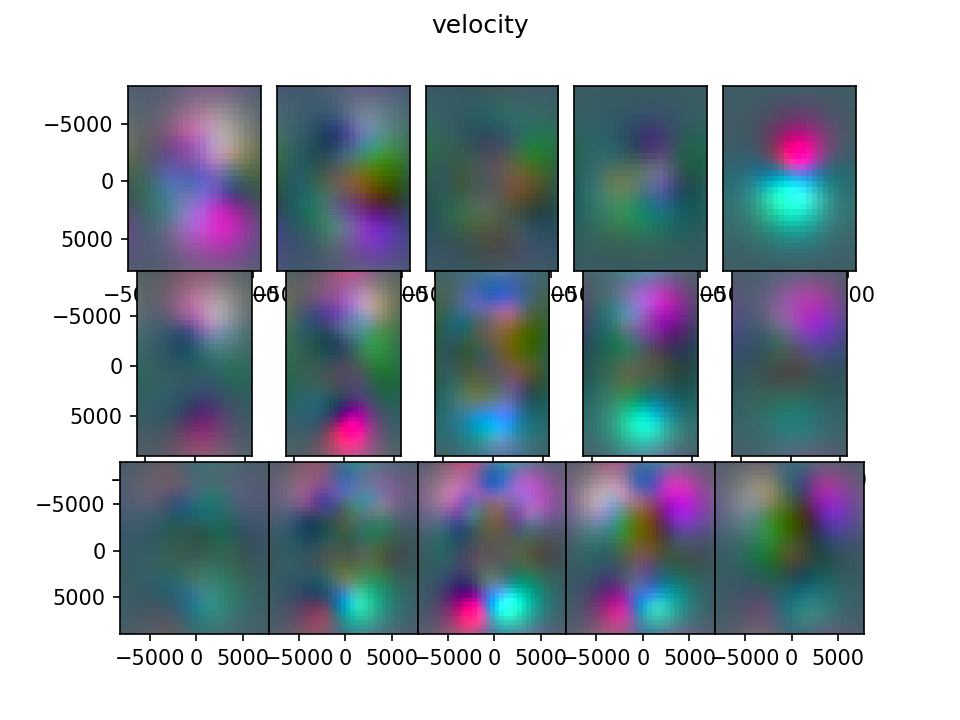

<IPython.core.display.Javascript object>


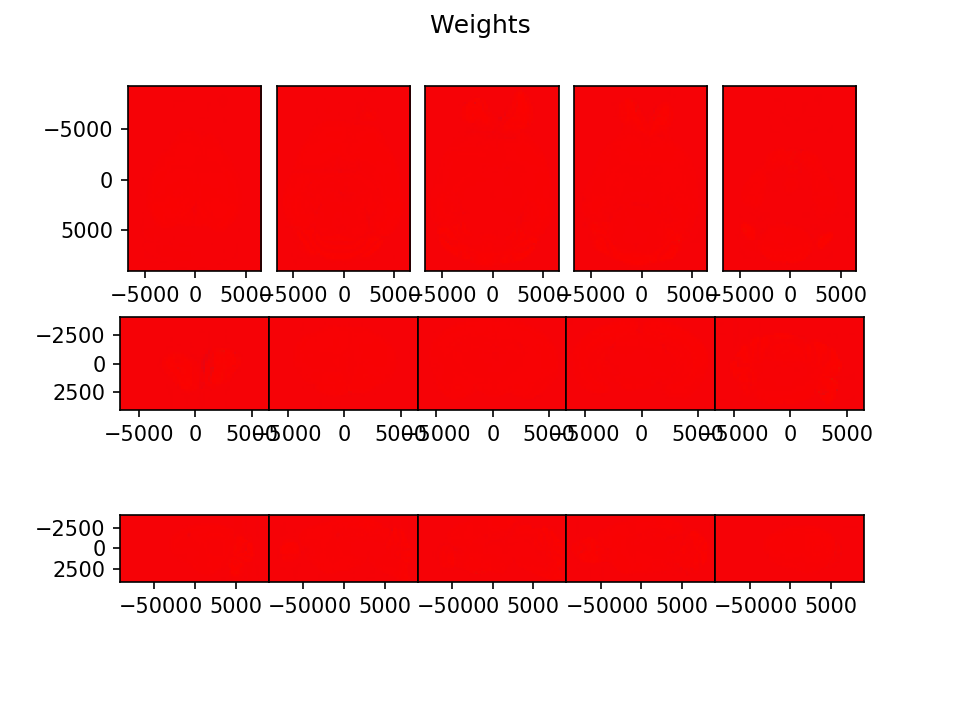

Finished iteration 0
Finished iteration 10
Finished iteration 20
Finished iteration 30
Iteration 40, linear oscilating, reducing eA to 90000.0
Finished iteration 40
Finished iteration 50
Finished iteration 60
Finished iteration 70
Iteration 80, linear oscilating, reducing eA to 81000.0
Finished iteration 80
Iteration 90, linear oscilating, reducing eA to 72900.0
Finished iteration 90
Finished iteration 100
Finished iteration 110
Finished iteration 120
Finished iteration 130
Finished iteration 140
Finished iteration 150
Finished iteration 160
Iteration 170, linear oscilating, reducing eA to 65610.0
Finished iteration 170
Finished iteration 180
Iteration 190, linear oscilating, reducing eA to 59049.0
Finished iteration 190
Finished iteration 200
Finished iteration 210
Iteration 220, linear oscilating, reducing eA to 53144.1
Finished iteration 220
Finished iteration 230
Finished iteration 240
Finished iteration 250
Finished iteration 260
Finished iteration 270
Finished iteration 280
Finis

Iteration 1660, translation oscilating, reducing eA to 131.0020508637622
Finished iteration 1660
Iteration 1670, translation oscilating, reducing eA to 117.90184577738599
Finished iteration 1670
Iteration 1680, translation oscilating, reducing eA to 106.11166119964739
Finished iteration 1680
Iteration 1690, translation oscilating, reducing eA to 95.50049507968265
Finished iteration 1690
Iteration 1700, translation oscilating, reducing eA to 85.95044557171438
Finished iteration 1700
Iteration 1710, translation oscilating, reducing eA to 77.35540101454295
Finished iteration 1710
Iteration 1720, linear oscilating, reducing eA to 69.61986091308866
Finished iteration 1720
Finished iteration 1730
Finished iteration 1740
Iteration 1750, translation oscilating, reducing eA to 62.65787482177979
Finished iteration 1750
Iteration 1760, linear oscilating, reducing eA to 56.392087339601815
Finished iteration 1760
Finished iteration 1770
Finished iteration 1780
Iteration 1790, linear oscilating, red

In [80]:
# second run, with deformation
imp.reload(emlddmm)
config1 = dict(config0)
config1['A'] = out['A']
config1['eA'] = config0['eA']*0.1
config1['a'] = 1000.0
config1['sigmaR'] = 5e4 # 1e4 gave really good results, but try 2e4, also good, I showed this in my slides
config1['n_iter']= 2000
config1['v_start'] = 0
config1['ev'] = 2e-2
config1['v_res_factor'] = config1['a']/dI[0]/2 # what is the resolution of v, as a multiple of that in I
config1['local_contrast'] = [32,32,32]
config1['local_contrast'] = [16,16,16]
#config1['local_contrast'] = [8,8,8] # way too small
config1['device'] = 'cpu'
# changing my inverses to double did not fix the issue
#config1['device'] = 'cuda:1'

#I_ = np.stack((I[2],I[0],I[1],I[0]**2,I[0]*I[1],I[1]**2,))

# the e step is every three
# why does the energy seem to bump up every 10?
# one thing I do is every 10 iterations I check if the energy is going down
# note this approach has an issue with background being black
I_ = np.stack((I[2],I[0]-np.mean(I[0]),I[1]-np.mean(I[1]),
               (I[0]-np.mean(I[0]))**2,
               (I[0]-np.mean(I[0]))*(I[1]-np.mean(I[1])),
               (I[1]-np.mean(I[0]))**2,))


out1 = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J, W0=W, **config1)

dv tensor([500., 500., 500.])
a scale is 1000.0


<IPython.core.display.Javascript object>


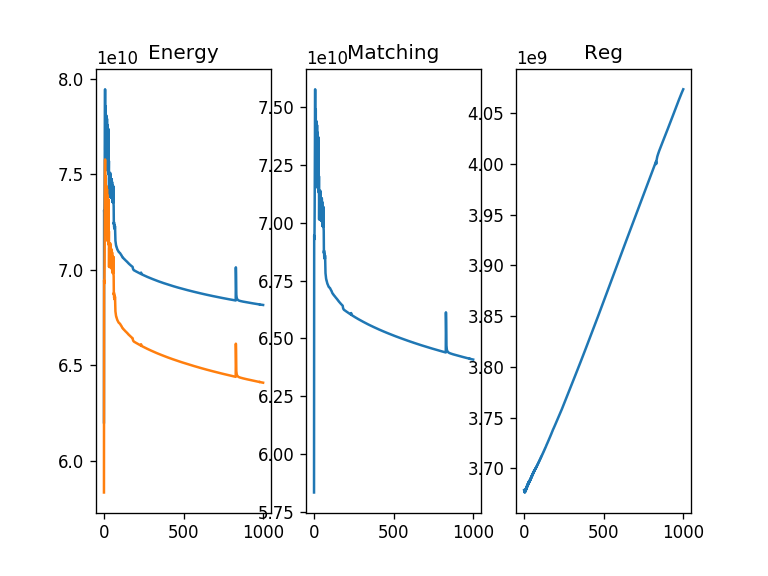

<IPython.core.display.Javascript object>


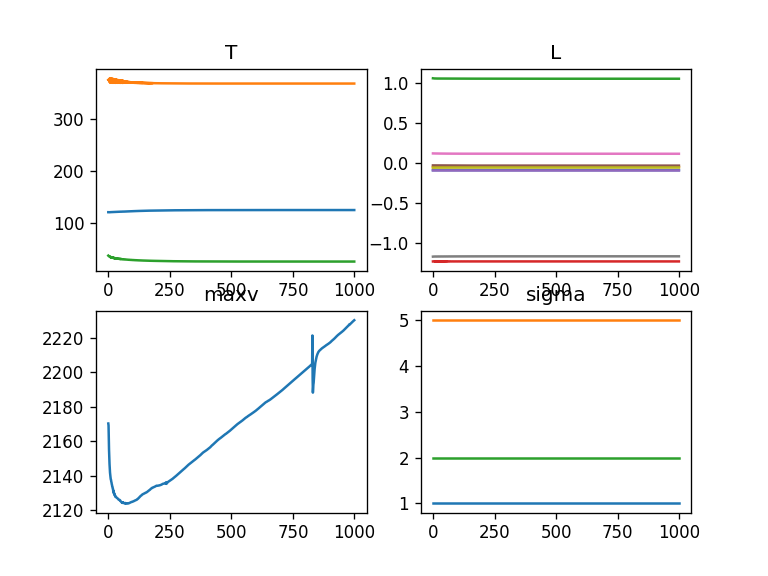

<IPython.core.display.Javascript object>


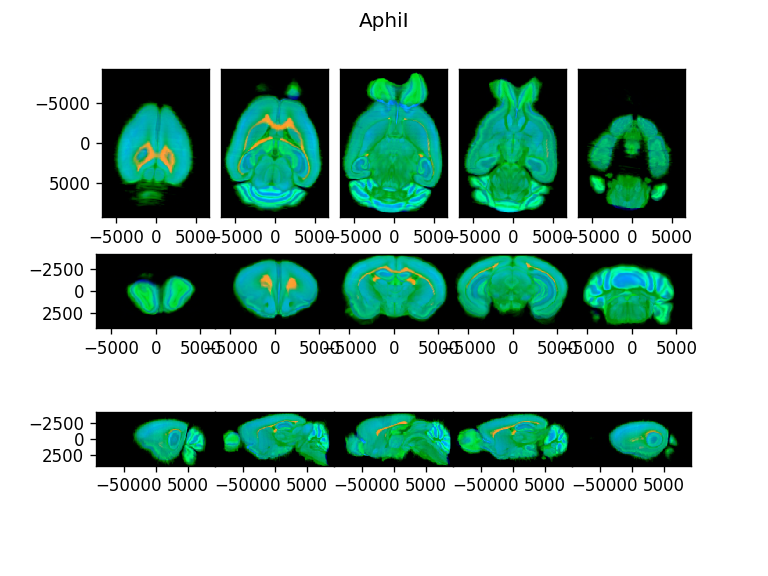

<IPython.core.display.Javascript object>


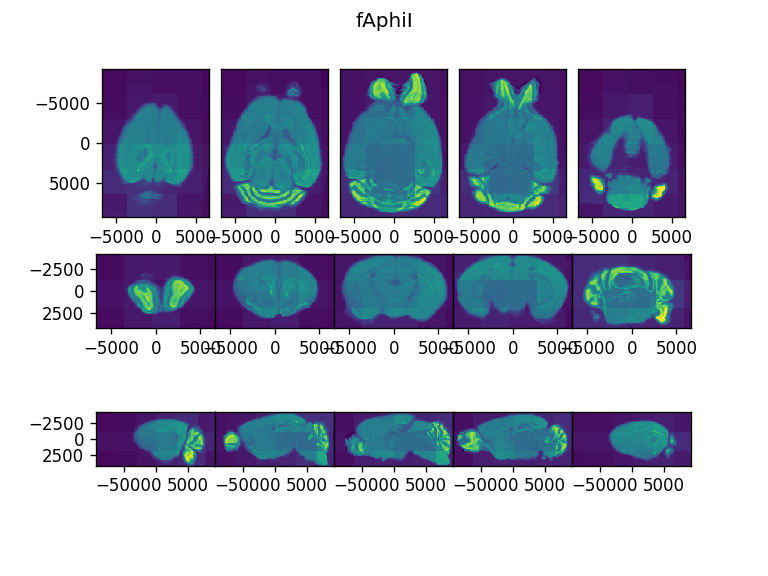

<IPython.core.display.Javascript object>


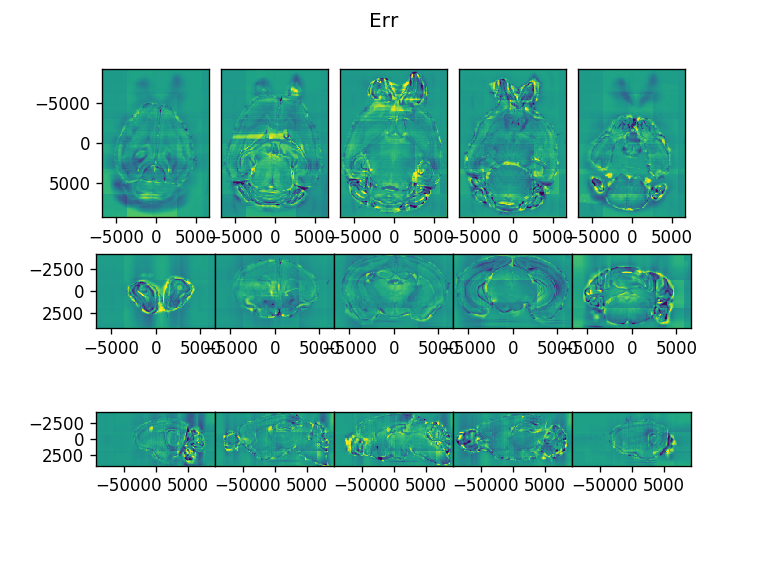

<IPython.core.display.Javascript object>


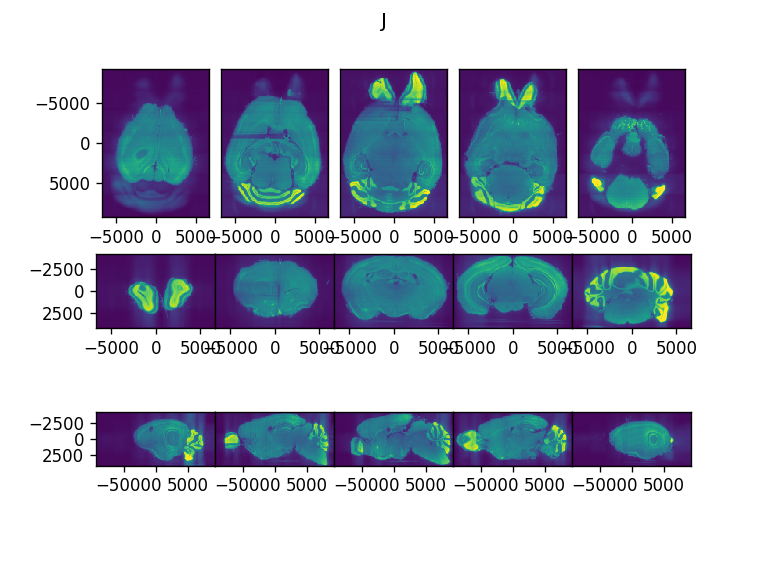

<IPython.core.display.Javascript object>


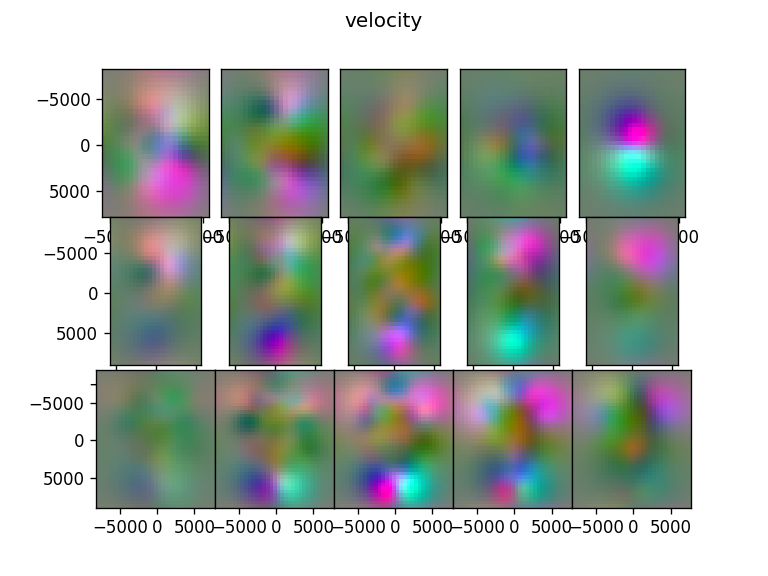

<IPython.core.display.Javascript object>


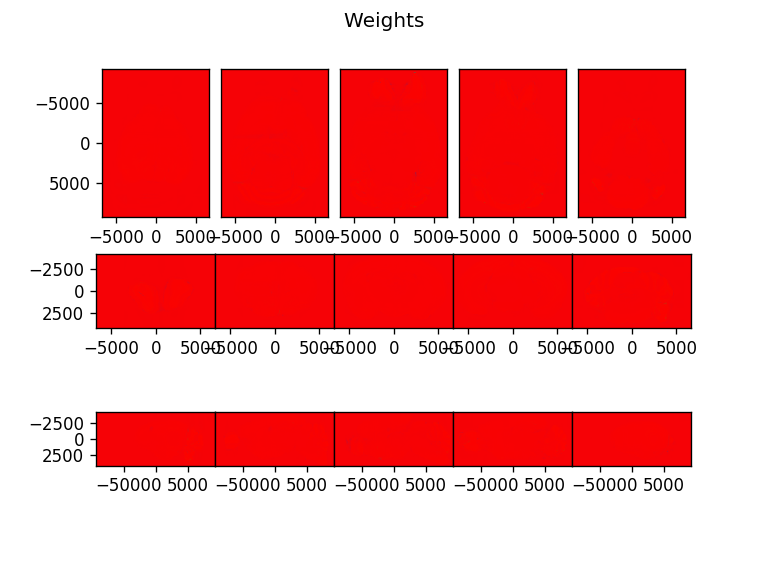

Finished iteration 0
Finished iteration 10
Iteration 20, translation oscilating, reducing eA to 90000.0
Finished iteration 20
Iteration 30 reducing ev to 0.018000000000000002
Iteration 30, translation oscilating, reducing eA to 81000.0
Finished iteration 30
Iteration 40, translation oscilating, reducing eA to 72900.0
Finished iteration 40
Iteration 50, translation oscilating, reducing eA to 65610.0
Finished iteration 50
Iteration 60 reducing ev to 0.016200000000000003
Iteration 60, translation oscilating, reducing eA to 59049.0
Finished iteration 60
Iteration 70 reducing ev to 0.014580000000000003
Iteration 70, translation oscilating, reducing eA to 53144.1
Finished iteration 70
Iteration 80, translation oscilating, reducing eA to 47829.69
Finished iteration 80
Iteration 90, translation oscilating, reducing eA to 43046.721000000005
Finished iteration 90
Iteration 100, translation oscilating, reducing eA to 38742.04890000001
Finished iteration 100
Iteration 110, translation oscilating, 

Finished iteration 990


In [52]:
imp.reload(emlddmm)
# on the next run we do les downsampling
config2 = dict(config1)
config2['A'] = out1['A']
config2['n_iter']= 1000
config2['v'] = out1['v']
config2['downI'] = [2,2,2]
config2['downJ'] = [2,2,2]
# there seems to be an issue with the initial velocity
# when I run this twice, I'm reusing it
out2 = emlddmm.emlddmm(xI=xI,I=I_,xJ=xJ,J=J, W0=W, **config2)
# the matching energy here is way way lower, why would that be?

In [54]:
out2['coeffs']

tensor([[[[[ 2.9401e-02],
           [ 0.0000e+00],
           [-1.9912e-01],
           [-9.3120e-02],
           [ 1.7170e-01],
           [ 1.7195e-01],
           [-4.7010e-01]],

          [[ 2.0459e+00],
           [ 0.0000e+00],
           [ 8.6456e-02],
           [ 5.2621e-01],
           [-3.5050e-02],
           [-3.1921e-01],
           [-9.1631e-01]],

          [[ 8.0510e-01],
           [ 0.0000e+00],
           [ 7.6911e-01],
           [-2.6922e-01],
           [-9.6011e-02],
           [ 6.2484e-01],
           [-5.1556e-01]],

          [[ 1.1989e+00],
           [ 0.0000e+00],
           [ 7.0124e-01],
           [ 8.6695e-04],
           [-2.3864e-01],
           [ 4.7362e-01],
           [-4.5730e-01]],

          [[ 4.3785e-01],
           [ 0.0000e+00],
           [-5.0198e-01],
           [ 9.8426e-02],
           [ 3.4967e-01],
           [-1.0068e-01],
           [-9.5560e-01]]],


         [[[ 1.0352e+00],
           [ 0.0000e+00],
           [ 4.3873e-01],


In [55]:
# save the outputs
savename = 'transformation_outputs_lightsheet_v03.npz'
np.savez(output_prefix+savename,out=out)

In [56]:
out2['figI'].savefig(output_prefix + 'transformed.jpg',**figopts)
out2['figfI'].savefig(output_prefix + 'contrast.jpg',**figopts)
out2['figErr'].savefig(output_prefix + 'err.jpg',**figopts)

4294967296 4294967296
4294967296 4294967296
4294967296 4294967296


In [57]:
fig = out2['figErr']
axs = fig.get_axes()
for ax in axs:
    ims = ax.get_images()
    for im in ims:
        im.set_cmap('twilight')
        clim = im.get_clim()
        lim = np.max(np.abs(clim))
        im.set_clim(np.array((-1,1))*lim)
fig.canvas.draw()
fig.savefig(output_prefix + 'err.jpg',**figopts)

4294967296 4294967296


In [59]:
# transform the labels
deformation = emlddmm.Transform(out2['v'],domain=out2['xv'],direction='b')
affine = emlddmm.Transform(out2['A'],direction='b')
tform = emlddmm.compose_sequence([affine,deformation],XJ)

starting to compose sequence with transforms [Transform with data size torch.Size([4, 4]), direction b, and domain <class 'NoneType'>, Transform with data size torch.Size([3, 38, 33, 24]), direction b, and domain <class 'list'>]


In [60]:
It = emlddmm.apply_transform_float(xI,I,tform).cpu().numpy()
RGBt = emlddmm.apply_transform_float(xI,RGB,tform).cpu().numpy()


In [61]:
imp.reload(emlddmm)
St = emlddmm.apply_transform_int(xI,S,tform,double=True).cpu().numpy()

<IPython.core.display.Javascript object>


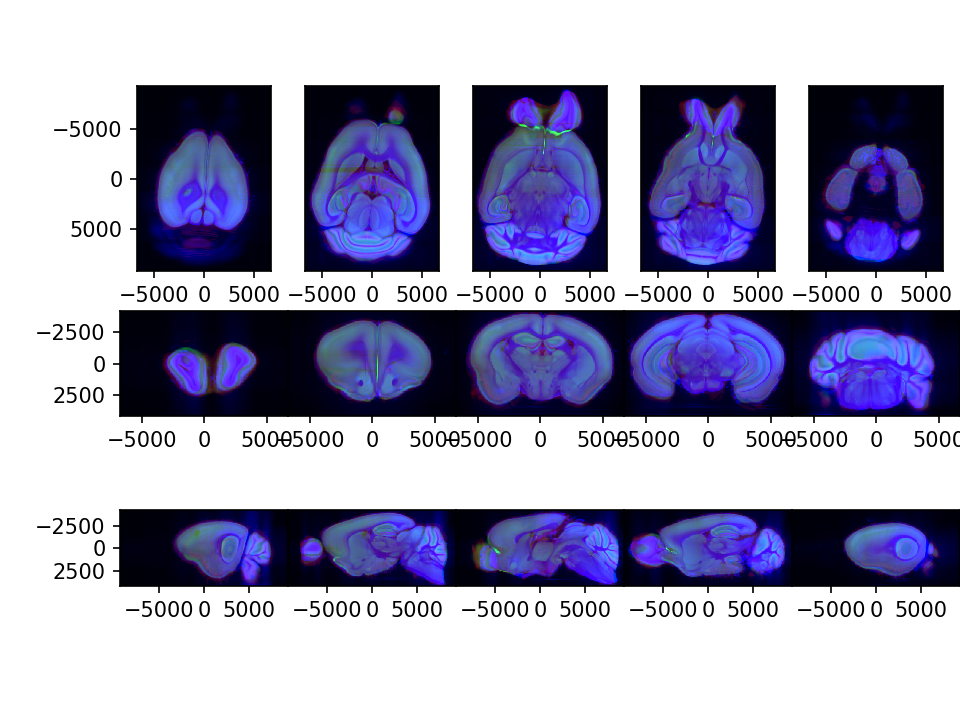

<IPython.core.display.Javascript object>


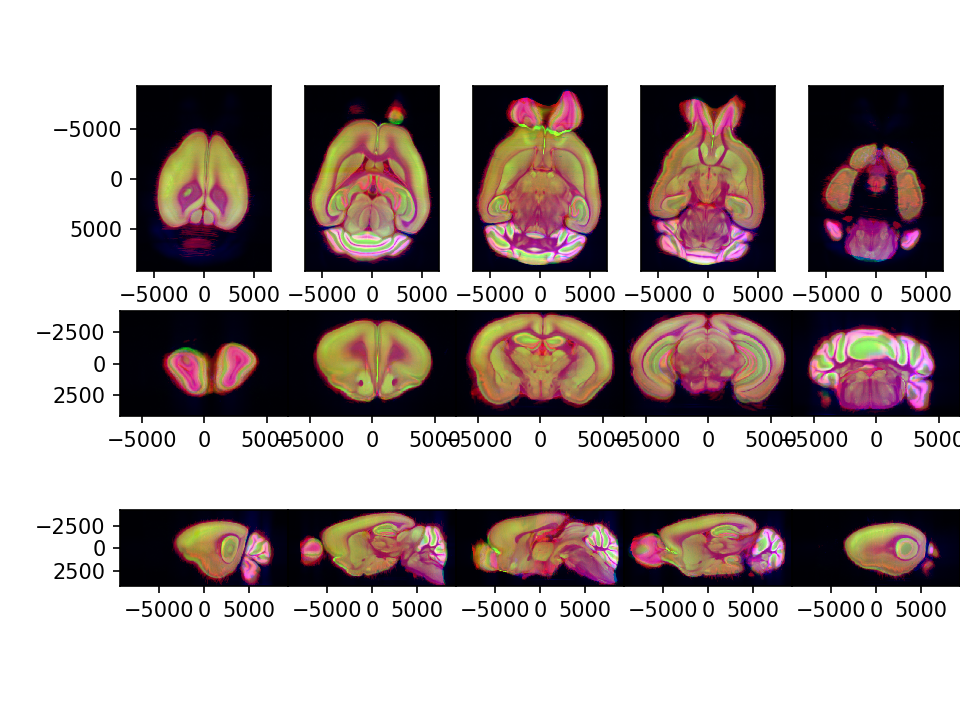

In [62]:
fig,ax = emlddmm.draw(np.stack((It[0]*0.5,It[1]*0.5,Jsave[0]*1.5)),xJ,vmin=0,vmax=4)
fig.subplots_adjust(wspace=0,hspace=0,right=1)
fig,ax = emlddmm.draw(np.stack((It[0]*0.5,It[1]*0.5,Jsave[0]*1.5)),xJ,)
fig.subplots_adjust(wspace=0,hspace=0,right=1)

<IPython.core.display.Javascript object>


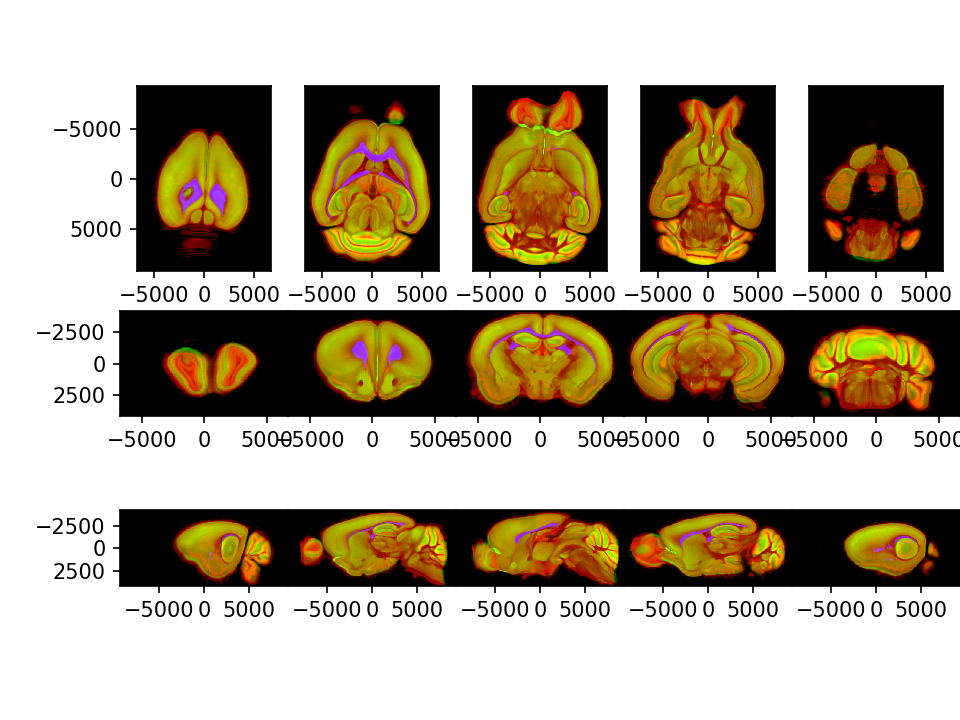

4294967296 4294967296


In [63]:
fig,ax = emlddmm.draw(It,xJ)
fig.subplots_adjust(wspace=0,hspace=0,right=1)
fig.savefig('Isave.jpg')

<IPython.core.display.Javascript object>


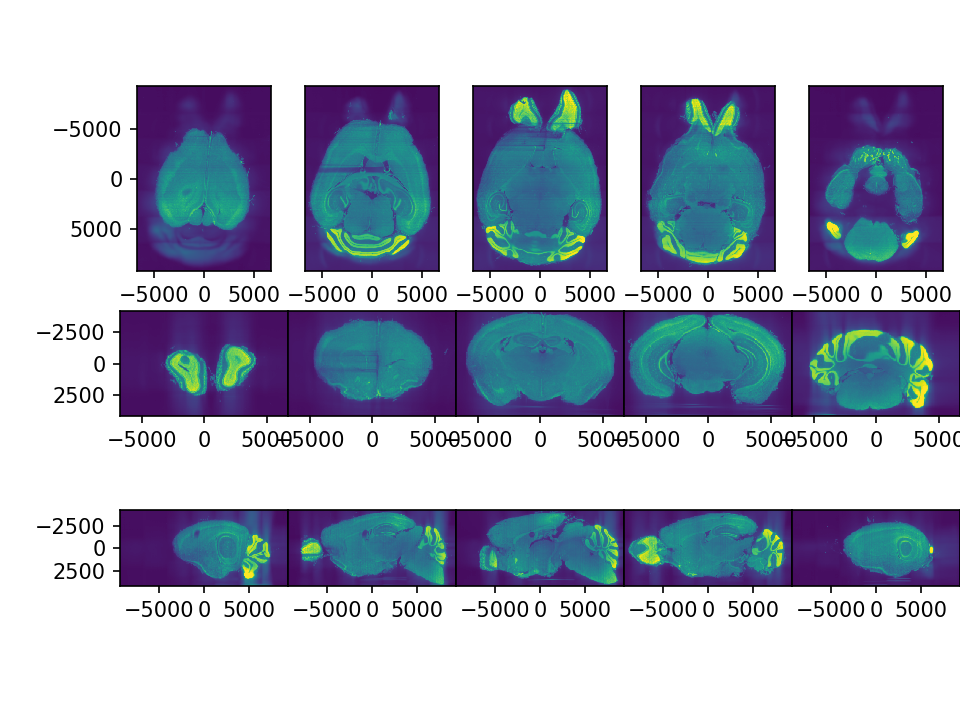

4294967296 4294967296


In [64]:
fig,ax = emlddmm.draw(J,xJ)
plt.subplots_adjust(wspace=0,hspace=0,right=1)
fig.savefig('Jsave.jpg')

In [65]:
dI = [x[1] - x[0] for x in xI]
dJ = [x[1] - x[0] for x in xJ]
dI,dJ

([50.0, 50.0, 50.0], [48.0, 49.14000000000124, 49.14000000000124])

In [66]:
# transform the labels
deformation = emlddmm.Transform(out2['v'],domain=out2['xv'],direction='f')
affine = emlddmm.Transform(out2['A'],direction='f')
tformi = emlddmm.compose_sequence([deformation,affine,],XI)
#J_ = J0**0.25
J_ = np.copy(J)
Jt = emlddmm.apply_transform_float(xJ,J_,tformi).cpu().numpy()

starting to compose sequence with transforms [Transform with data size torch.Size([3, 38, 33, 24]), direction f, and domain <class 'list'>, Transform with data size torch.Size([4, 4]), direction f, and domain <class 'NoneType'>]


<IPython.core.display.Javascript object>


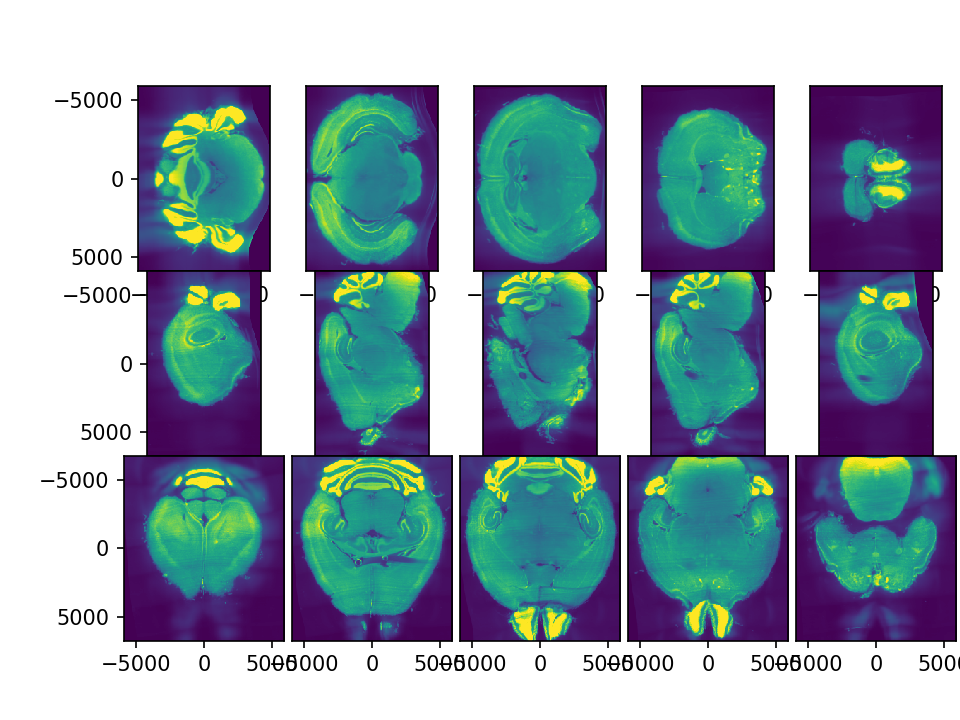

In [67]:
fig,ax = emlddmm.draw(Jt,xI,vmin=np.quantile(J_,0.02),vmax=np.quantile(J_,0.98))
fig.subplots_adjust(wspace=0,hspace=0,right=1)

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


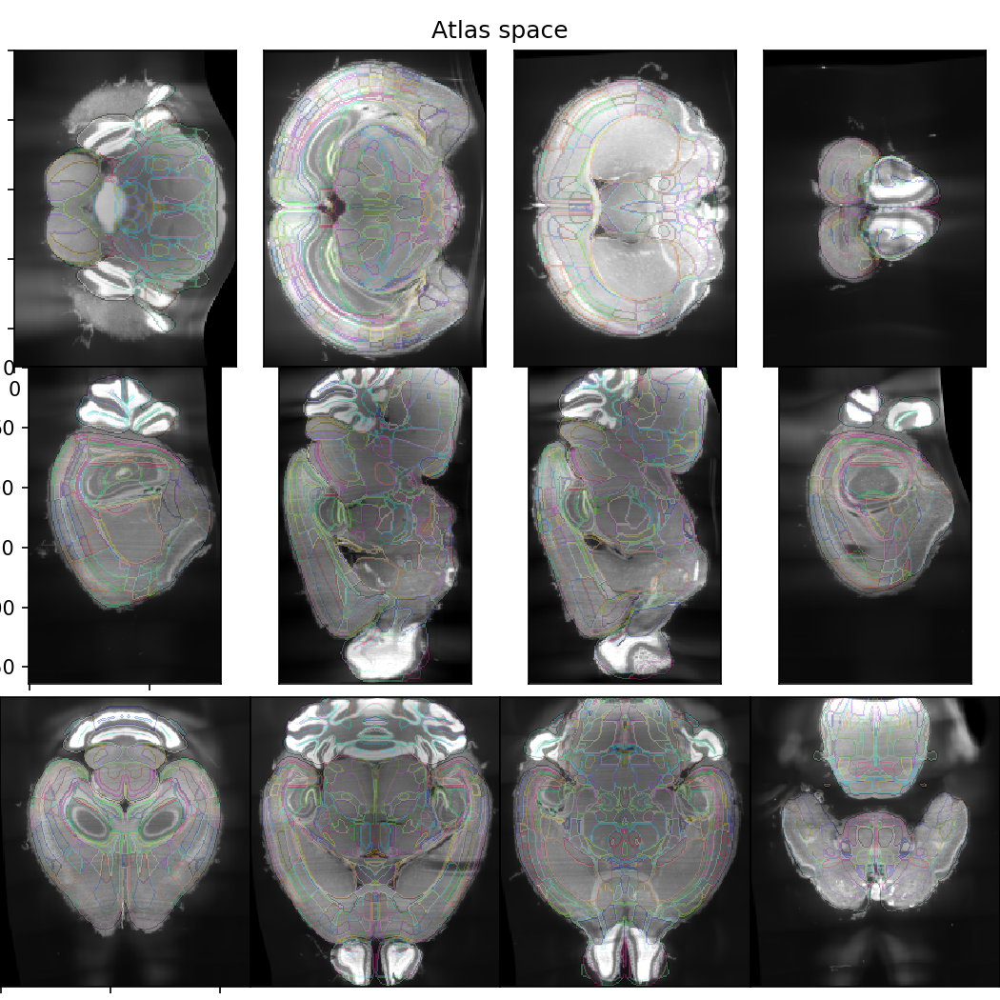

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

4294967296 4294967296


In [68]:
alpha = 0.3
fig = plt.figure(figsize=(7,7))
n = 4
slices = np.round(np.linspace(0,I.shape[1],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1)    
    
    # get slices
    RGB_ = RGB[:,slices[i]].transpose(1,2,0)
    S_ = S[0,slices[i]]
    Jt_ = np.copy(Jt[0,slices[i]])
    Jt_ -= np.quantile(Jt_,0.01)
    Jt_ /= np.quantile(Jt_,0.99)
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
    
slices = np.round(np.linspace(0,I.shape[2],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n)    
    
    # get slices
    RGB_ = RGB[:,:,slices[i]].transpose(1,2,0)
    S_ = S[0,:,slices[i]]
    Jt_ = np.copy(Jt[0,:,slices[i]])
    Jt_ -= np.quantile(Jt_,0.01)
    Jt_ /= np.quantile(Jt_,0.99)
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])

slices = np.round(np.linspace(0,I.shape[3],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n+n)    
    
    # get slices
    RGB_ = RGB[:,:,:,slices[i]].transpose(1,2,0)
    S_ = S[0,:,:,slices[i]]
    Jt_ = np.copy(Jt[0,:,:,slices[i]])
    Jt_ -= np.quantile(Jt_,0.01)
    Jt_ /= np.quantile(Jt_,0.99)
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])    
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
fig.suptitle('Atlas space')
fig.subplots_adjust(wspace=0,hspace=0,left=0.0,right=1,bottom=0,top=0.95)
fig.savefig(output_prefix+'atlas_space.jpg',**figopts)

/home/dtward/.local/intelpython3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


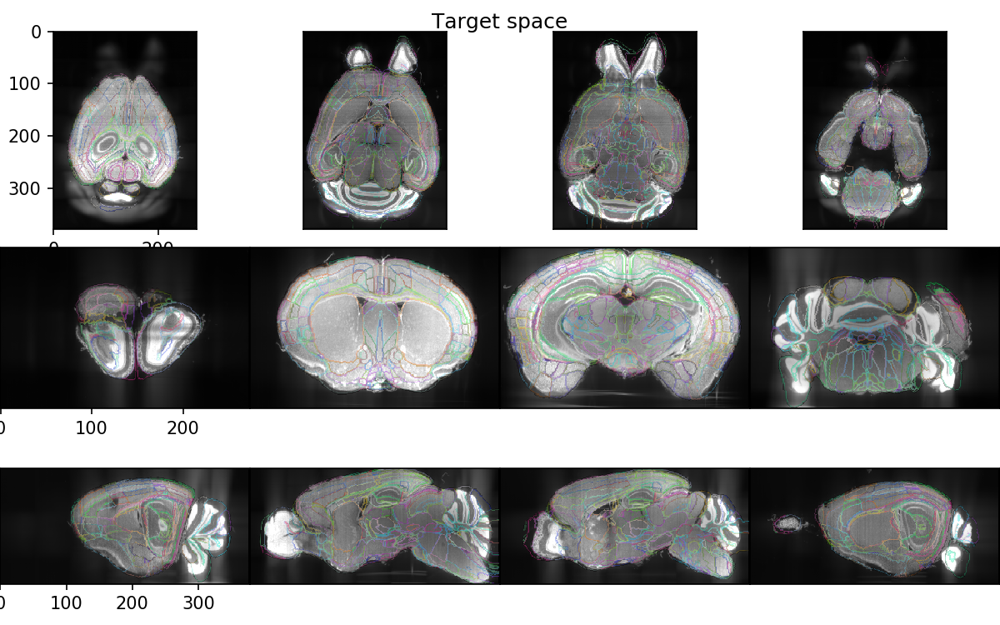

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

4294967296 4294967296


In [69]:
alpha = 0.4
fig = plt.figure(figsize=(8,5))
n = 4
slices = np.round(np.linspace(0,J.shape[1],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1)    
    
    # get slices
    RGB_ = RGBt[:,slices[i]].transpose(1,2,0)
    S_ = St[0,slices[i]]
    Jt_ = np.copy(J[0,slices[i]])
    Jt_ -= np.quantile(Jt_,0.01)
    Jt_ /= np.quantile(Jt_,0.99)
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
    
slices = np.round(np.linspace(0,J.shape[2],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n)    
    
    # get slices
    RGB_ = RGBt[:,:,slices[i]].transpose(1,2,0)
    S_ = St[0,:,slices[i]]
    Jt_ = np.copy(J[0,:,slices[i]])
    Jt_ -= np.quantile(Jt_,0.01)
    Jt_ /= np.quantile(Jt_,0.99)
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])

slices = np.round(np.linspace(0,J.shape[3],n+2)[1:-1]).astype(int)
for i in range(n):
    ax = fig.add_subplot(3,n,i+1 + n+n)    
    
    # get slices
    RGB_ = RGBt[:,:,:,slices[i]].transpose(1,2,0)
    S_ = St[0,:,:,slices[i]]
    Jt_ = np.copy(J[0,:,:,slices[i]])
    Jt_ -= np.quantile(Jt_,0.01)
    Jt_ /= np.quantile(Jt_,0.99)
    # find boundaries
    border = S_ != np.roll(S_,shift=1,axis=0)
    border |= S_ != np.roll(S_,shift=-1,axis=0)
    border |= S_ != np.roll(S_,shift=1,axis=1)
    border |= S_ != np.roll(S_,shift=-1,axis=1)
    
    # draw
    ax.imshow(alpha*border[...,None]*RGB_ + ((1-alpha*border)*Jt_)[...,None])    
    if i>0:
        ax.set_xticks([])
        ax.set_yticks([])
fig.suptitle('Target space')
fig.subplots_adjust(wspace=0,hspace=0,left=0.0,right=1,bottom=0,top=0.95)
fig.savefig(output_prefix+'target_space.jpg',**figopts)